# ETA Final Project
##### DS5001 Summer 2021
##### Chelsea Alvarado - cxa6ky

## Part 1: Corpus Read-in, Table Creation, and Tokenization

#### Ready, Set, Go!

In [1]:
#timer to see how long whole notebook takes
import time
t0 = time.time()

#### Initial Configurations

In [2]:
import pandas as pd
import numpy as np
from glob import glob #read directory system to import files
import re
import nltk

%matplotlib inline

In [3]:
OHCO = ['book_id','chap_num', 'para_num', 'sent_num', 'token_num']
OHCO2 = ["Author", "Title", 'chap_num', 'para_num', 'sent_num', 'token_num']
epub_dir = r"C:\Users\17039\Documents\MSDS\Summer2021\DS5001\ETA Final Project\text_sources_banned" #location of text files

#### Inspect and chunk

In [4]:
roman = '[IVXLCM]+'
caps = "[A-Z';, -]+"
letters = '[A-Za-z*]+'
numbers = '[0-9]+'

In [5]:
chap_pats = {
    1: { # 1984
        'start_line': 11,
        'end_line': 2833,
        'part': re.compile('^\s*Part\s+{}\s*$'.format(letters)),
        'chapter': re.compile('^\s*Chapter\s+{}\s*$'.format(numbers))
    },
     2: { # Animal Farm
        'start_line': 67,
        'end_line': 902,
        'chapter': re.compile('^\s*Chapter\s+{}\s*$'.format(numbers))
    },
     3: { # Catcher in the Rye
        'start_line': 15,
        'end_line': 4004,
        'chapter': re.compile('^\s*{}\s*$'.format(numbers))
    },
     4: { # Harry Potter
        'start_line': 34,
        'end_line': 6613,
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(caps)) 
    },
     5: { # Song of Solomon
        'start_line': 105,
        'end_line': 6249,
        'part': re.compile("^\s*Part\s+{}\s*$".format(roman)),
        'chapter': re.compile('^\s*Chapter\s+{}\s*$'.format(numbers))
    },
     6: { # hand maids tale
        'start_line': 64,
        'end_line': 4596,
        'part': re.compile('^\s*{}\s*$'.format(caps)),
        'chapter': re.compile('^\s*CHAPTER\s+{}\s*$'.format(caps))
    },
    7: { # the jungle
        'start_line': 153,
        'end_line': 3396,
        'chapter': re.compile('^\s*Chapter\s+{}\s*$'.format(numbers))
    },
   8: { # TKAM
        'start_line': 37,
        'end_line': 7030,
        'part': re.compile('^\s*PART\s+{}\.$'.format(caps)),
        'chapter': re.compile('^\s*{}\s*$'.format(numbers)) # chapter is just a number
    }
}

In [6]:
def acquire_epubs(epub_list, chap_pats, OHCO=OHCO):
    
    my_lib = []
    my_doc = []

    for epub_file in epub_list:
        
        # Get ID from filename
        book_id = int(epub_file.split('-')[-1].split('.')[0])
        print("BOOK ID", book_id)
        
        #get author
        author = epub_file.split('\\')[-1].split('-')[0]
        
        # Import file as lines
        lines = open(epub_file, 'r', encoding='utf-8-sig').readlines()
        df = pd.DataFrame(lines, columns=['line_str'])
        df.index.name = 'line_num'
        df.line_str = df.line_str.str.strip()
        df['book_id'] = book_id
        
        
        # FIX CHARACTERS TO IMPROVE TOKENIZATION
        df.line_str = df.line_str.str.replace('—', ' — ')
        df.line_str = df.line_str.str.replace('-', ' - ')
        
        # Get book title and put into LIB table -- note problems, though
        book_title = epub_file.split('\\')[-1].split('-')[1]
        
        # Remove cruft
        a = chap_pats[book_id]['start_line'] - 1
        b = chap_pats[book_id]['end_line'] + 1
        df = df.iloc[a:b]
        
        # Chunk by chapter
        chap_lines = df.line_str.str.match(chap_pats[book_id]['chapter'])
        chap_nums = [i+1 for i in range(df.loc[chap_lines].shape[0])]
        df.loc[chap_lines, 'chap_num'] = chap_nums
        df.chap_num = df.chap_num.ffill()

        # Clean up
        df = df[~df.chap_num.isna()] # Remove chapter heading lines
        df = df.loc[~chap_lines] # Remove everything before Chapter 1
        df['chap_num'] = df['chap_num'].astype('int')
        
        # Group -- Note that we exclude the book level in the OHCO at this point
        df = df.groupby(OHCO[1:2]).line_str.apply(lambda x: '\n'.join(x)).to_frame() # Make big string
        # Split into paragrpahs
        df = df['line_str'].astype(str).str.split(r'\n\n+', expand=True).stack().to_frame().rename(columns={0:'para_str'})
        df.index.names = OHCO[1:3] # MAY NOT BE NECESSARY UNTIL THE END
        df['para_str'] = df['para_str'].astype(str).str.replace(r'\n', ' ').str.strip()
        df = df[~df['para_str'].str.match(r'^\s*$')] # Remove empty paragraphs
        
        # Set index
        df['book_id'] = book_id
        df = df.reset_index().set_index(OHCO[:3])

        # Register
        my_lib.append((book_id, book_title, author))
        my_doc.append(df)

    docs = pd.concat(my_doc)
    library = pd.DataFrame(my_lib, columns=['book_id', 'Title', 'Author']).set_index('book_id')
    return library, docs

In [7]:
#register and chunk text using defined function
epubs = [epub for epub in sorted(glob(epub_dir+'\*.txt'))]
LIB, DOC = acquire_epubs(epubs, chap_pats)

BOOK ID 1
BOOK ID 2
BOOK ID 8
BOOK ID 3
BOOK ID 4
BOOK ID 6
BOOK ID 5
BOOK ID 7


#### Tokenize and create Token Table

In [8]:
def tokenize(doc_df, remove_pos_tuple=False, OHCO=OHCO):
    
    # Paragraphs to Sentences
    df = doc_df.para_str\
        .apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'sent_str'})
    
    # Sentences to Tokens
    # .apply(lambda x: pd.Series(nltk.pos_tag(nltk.word_tokenize(x))))\
    df = df.sent_str\
        .apply(lambda x: pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x))))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [9]:
token = tokenize(DOC)

In [10]:
token

pos_tuple  pos token_str
book_id chap_num para_num sent_num token_num                               
1       1        1        0        0               (It, PRP)  PRP        It
                                   1              (was, VBD)  VBD       was
                                   2                 (a, DT)   DT         a
                                   3            (bright, JJ)   JJ    bright
                                   4              (cold, JJ)   JJ      cold
...                                                      ...  ...       ...
7       31       48       20       3             (ours!, JJ)   JJ     ours!
                          21       0          (CHICAGO, NNP)  NNP   CHICAGO
                                   1              (WILL, MD)   MD      WILL
                                   2                (BE, VB)   VB        BE
                                   3           (OURS!”, NNP)  NNP    OURS!”

[748641 rows x 3 columns]

In [11]:
#add term_str to TOKEN table
token['term_str'] = token['token_str'].str.lower().str.replace('[\W_]', '')

In [12]:
token = token.reset_index()
token = pd.merge(token, LIB, on = "book_id", how = "inner") # merge token table with lib table to get title and author in token table

#### Vocab Table creation and manipulation

In [13]:
vocab = token.term_str.value_counts().to_frame().rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
vocab.index.name = 'term_id'

vocab['num'] = vocab.term_str.str.match("\d+").astype('int')

#### Stopwords

In [14]:
#stopwords
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [15]:
vocab['stop'] = vocab.term_str.map(sw.dummy)
vocab['stop'] = vocab['stop'].fillna(0).astype('int')

In [16]:
vocab[vocab.stop == 1].sample(10)

,term_str,n,num,stop
term_id,,,,
493,after,891,0,1
23905,won,64,0,1
14310,once,597,0,1
9690,having,214,0,1
23669,who,1648,0,1
23597,which,1440,0,1
13086,mightn,1,0,1
23579,when,2662,0,1
10228,how,1029,0,1


#### Stems

In [17]:
#stems
from nltk.stem.porter import PorterStemmer

stemmer = PorterStemmer()
vocab['p_stem'] = vocab.term_str.apply(stemmer.stem)

#### Export out Checkpoint Tables

In [18]:
#save tables/ checkpoint
DOC.to_csv('DOC.csv', index = False)
LIB.to_csv('LIB.csv')
vocab.to_csv('VOCAB.csv')
token.to_csv('TOKEN.csv', index = False)

## Part 2: Statistical/Linguistics Features and TFIDF

#### Updated Configs

In [19]:
OHCO = OHCO2
SENTS = OHCO[:5]
PARAS = OHCO[:4]
CHAPS = OHCO[:3]
BOOKS = OHCO[:2]

In [20]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth
gradient_cmap = 'YlGnBu'

#### Read in Checkpointed tables

In [21]:
VOCAB = pd.read_csv("VOCAB.csv")
LIB = pd.read_csv("LIB.csv")
TOKEN = pd.read_csv("TOKEN.csv", dtype = {'Author':'str','Title':'str','chap_num':'int', 'para_num':'int', 'sent_num':'int', 'token_num':'int',\
                                           'book_id':'int','pos_tuple':'str','pos':'str','token_str':'str',
                                           'term_str':'str','term_id': 'int'})

#### Add in needed statistical/linguistic terms

In [22]:
# remove any empty rows
VOCAB = VOCAB[~VOCAB.term_str.isna()]
TOKEN = TOKEN[~TOKEN.term_str.isna()]

#add term_id to token table
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [23]:
# add pos to VOCAB
pos = TOKEN[['term_id','pos']]
VOCAB = pd.merge(VOCAB,pos, on = "term_id").reset_index().drop_duplicates('term_id').set_index('term_id')

In [24]:
# Add in pos_max and term_rank
VOCAB['pos_max'] = VOCAB.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [25]:
#add in alternate term_rank
new_rank = VOCAB.n.value_counts()\
    .sort_index(ascending=False).reset_index().reset_index()\
    .rename(columns={'level_0':'term_rank2', 'index':'n', 'n':'nn'})\
    .set_index('n')
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1

#adding in probabilities
VOCAB['p'] = VOCAB.n / VOCAB.shape[0]

In [26]:
#zipfs
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

VOCAB.describe().T

,count,mean,std,min,25%,50%,75%,max
term_rank,24236.0,12118.500000,6996.474898,1.000000,6059.750000,12118.500000,18177.250000,24236.000000
index,24236.0,342438.426679,196367.270998,0.000000,152099.250000,353192.500000,494773.000000,739266.000000
n,24236.0,30.502847,428.168403,1.000000,1.000000,2.000000,7.000000,38076.000000
num,24236.0,0.005735,0.075516,0.000000,0.000000,0.000000,0.000000,1.000000
stop,24236.0,0.005900,0.076588,0.000000,0.000000,0.000000,0.000000,1.000000
term_rank2,24236.0,508.416818,49.238070,1.000000,516.000000,521.000000,522.000000,522.000000
p,24236.0,0.001259,0.017667,0.000041,0.000041,0.000083,0.000289,1.571051
zipf_k,24236.0,34015.523643,17119.722821,15082.000000,21140.750000,28673.000000,42852.500000,112920.000000
zipf_k2,24236.0,5526.634098,13397.184227,522.000000,522.000000,1042.000000,3612.000000,112920.000000
zipf_k3,24236.0,0.228034,0.552780,0.021538,0.021538,0.042994,0.149034,4.659185


In [27]:
#prior prob
VOCAB['p2'] = VOCAB.n / VOCAB.n.sum()

#entropy
VOCAB['h'] = VOCAB.p2 * np.log2(1/VOCAB.p2) # Self entropy of each word 
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [28]:
print("H \t= {}\nH_max \t= {}\nR \t= {}%".format(H, H_max, int(R)))

H 	= 9.741739565720097
H_max 	= 14.564863990226941
R 	= 33%


In [29]:
VOCAB.head(5)

,term_rank,index,term_str,n,num,stop,p_stem,pos,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h
term_id,,,,,,,,,,,,,,,,
21330,1,557867,the,38076,0,1,the,DT,DT,1,1.571051,38076,38076,1.571051,0.051505,0.220398
779,2,35732,and,22180,0,1,and,CC,CC,2,0.915168,44360,44360,1.830335,0.030003,0.151777
21656,3,625943,to,18484,0,1,to,TO,TO,3,0.762667,55452,55452,2.288001,0.025003,0.133060
140,4,260,a,17157,0,1,a,DT,DT,4,0.707914,68628,68628,2.831655,0.023208,0.126002
14213,5,408649,of,16386,0,1,of,IN,IN,5,0.676102,81930,81930,3.380508,0.022165,0.121810


#### TFIDF

In [30]:
def TFIDF_gen(df, bag, count_type, tf_type, idf_type):
    
    #global vars
    global TF
    global DF
    global IDF
    global BOW
    global TFIDF
    
    
    #create BOW
    BOW = df.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})
    BOW['c'] = BOW.n.astype('bool').astype('int')
    
    #count matrix
    DTCM = BOW[count_type].unstack().fillna(0).astype('int')
    
    #term frequency
    print('TF method:', tf_type)

    if tf_method == 'sum':
        TF = DTCM.T / DTCM.T.sum()

    elif tf_method == 'max':
        TF = DTCM.T / DTCM.T.max()

    elif tf_method == 'log':
        TF = np.log10(1 + DTCM.T)
    
    elif tf_method == 'raw':
        TF = DTCM.T

    elif tf_method == 'double_norm':
        TF = DTCM.T / DTCM.T.max()
        TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] 

    elif tf_method == 'binary':
        TF = DTCM.T.astype('bool').astype('int')
    
    TF = TF.T
    
    #Document frequency
    
    DF = DTCM[DTCM > 0].count()

    
    #IDF
    N = DTCM.shape[0]
    print('IDF method:', idf_type)

    if idf_method == 'standard':
        IDF = np.log10(N / DF)

    elif idf_method == 'max':
        IDF = np.log10(DF.max() / DF) 

    elif idf_method == 'smooth':
        IDF = np.log10((1 + N) / (1 + DF)) + 1
      
    IDF = IDF
    #TFIDF
    
    TFIDF = TF * IDF
    
    return TFIDF

In [31]:
bag = BOOKS
tfidf_init = TFIDF_gen(TOKEN, bag, count_method, tf_method, idf_method)

TF method: sum
IDF method: standard


In [32]:
tfidf_init

term_id                                                   1         2      \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000010   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000008   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000093   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000000   
Upton Sinclair  The Jungle                             0.000012  0.000002   

term_id                                                   3         4      \
Author          Title                                                       
George Orwell   1984                                   0.000027  0.000135   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000000   
Upton Sinclair  The Jungle                             0.000000  0.000000   

term_id                                                   5         6      \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000000   
Upton Sinclair  The Jungle                             0.000006  0.000006   

term_id                                                   7         8      \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000006  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000005  0.000000   
Upton Sinclair  The Jungle                             0.000000  0.000006   

term_id                                                   9         10     \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000008  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000005  0.000000   
Upton Sinclair  The Jungle                             0.000000  0.000006   

term_id                                                ...     24227  \
Author          Title                                  ...             
G

#### Add tfidf values into VOCAB and TOKEN tables

In [33]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF
VOCAB['tfidf_sum'] = TFIDF.sum()
VOCAB.sample()

,term_rank,index,term_str,n,num,stop,p_stem,pos,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h,df,idf,tfidf_sum
term_id,,,,,,,,,,,,,,,,,,,
2104,13841,98522,bled,2,0,0,bled,VB,VB,521,0.000083,27682,1042,0.042994,0.000003,0.00005,2,0.60206,0.000013


In [34]:
# sort vocab by descending tfidf_sum
VOCAB[['term_rank','term_str','pos_max','tfidf_sum']].sort_values('tfidf_sum', ascending=False).head(20)\
    .style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
11331,101,jem,NNP,0.008771
1269,124,atticus,NNP,0.007116
11503,89,jurgis,NNP,0.006555
9631,77,harry,NNP,0.004783
17671,218,ron,NNP,0.004757
13671,540,napoleon,NNP,0.004393
9472,269,hagrid,NNP,0.003898
9886,336,hermione,NNP,0.002982
13110,177,milkman,NN,0.002850


In [35]:
#create a reduced VOCAB table to merge onto TOKEN
VOCAB_min = VOCAB.reset_index().copy()
VOCAB_min = VOCAB_min[['term_id', 'tfidf_sum']]
VOCAB_min

,term_id,tfidf_sum
0,21330,0.000000
1,779,0.000000
2,21656,0.000000
3,140,0.000000
4,14213,0.000000
...,...,...
24231,17169,0.000030
24232,8269,0.000008
24233,17172,0.000009
24234,17173,0.000010


In [36]:
#merge VOCAB_min onto TOKEN
TOKEN2 = TOKEN.reset_index().copy()
TOKEN2 = pd.merge(TOKEN2, VOCAB_min,how = 'inner', on = "term_id").set_index('term_id')
TOKEN2

,index,book_id,chap_num,para_num,sent_num,token_num,pos_tuple,pos,token_str,term_str,Title,Author,tfidf_sum
term_id,,,,,,,,,,,,,
11215,0,1,1,1,0,0,"('It', 'PRP')",PRP,It,it,1984,George Orwell,0.000000
11215,69,1,1,2,1,4,"('it', 'PRP')",PRP,it,it,1984,George Orwell,0.000000
11215,84,1,1,2,2,0,"('It', 'PRP')",PRP,It,it,1984,George Orwell,0.000000
11215,119,1,1,2,4,0,"('It', 'PRP')",PRP,It,it,1984,George Orwell,0.000000
11215,132,1,1,2,5,6,"('it', 'PRP')",PRP,it,it,1984,George Orwell,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15682,748319,7,31,48,8,39,"('polled', 'VBN')",VBN,polled,polled,The Jungle,Upton Sinclair,0.000006
13551,748423,7,31,48,12,8,"('municipal', 'JJ')",JJ,municipal,municipal,The Jungle,Upton Sinclair,0.000012
13551,748490,7,31,48,15,9,"('municipal', 'JJ')",JJ,municipal,municipal,The Jungle,Upton Sinclair,0.000012


#### Export out Checkpoint Tables

In [37]:
#checkpoint tables
VOCAB.to_csv('VOCAB2.csv')
TOKEN2.to_csv('TOKEN2.csv')
tfidf_init.to_csv('TFIDF.csv')

## Part 3: Distances

#### Updated Configurations

In [38]:
import re 
from numpy.linalg import norm
from scipy.spatial.distance import pdist
import seaborn as sns

#### Read In Checkpointed Tables

In [39]:
TOKEN = pd.read_csv('TOKEN2.csv')
VOCAB = pd.read_csv('VOCAB2.csv').set_index('term_id')
LIB = pd.read_csv("LIB.csv")

In [40]:
tfidf = pd.read_csv('TFIDF.csv')

In [41]:
tfidf

,Author,Title,1,2,3,4,5,6,7,8,...,24227,24228,24229,24230,24231,24232,24233,24234,24235,24236
0,George Orwell,1984,0.000000,0.000000,0.000027,0.000135,0.000000,0.000000,0.000000,0.000000,...,0.000006,0.000000,0.00000,0.000000,0.000000,0.000000,0.000006,0.000000,0.000000,0.00000
1,George Orwell,Animal Farm,0.000000,0.000010,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
2,Harper Lee,To Kill a Mockingbird,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000006,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
3,J.D. Salinger,Catcher in the Rye,0.000000,0.000008,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000000,0.000042,0.000000,0.000008,0.000000,0.00000
4,J.K. Rowling,Harry Potter and the Sorcerer's Stone,0.000000,0.000093,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.00000,0.000000,0.000023,0.000027,0.000008,0.000008,0.000015,0.00000
5,Margaret Atwood,The Handmaid's Tale,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000039,0.00001,0.000000,0.000000,0.000010,0.000000,0.000000,0.000007,0.00001
6,Toni Morrison,Song of Solomon,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000005,0.000000,...,0.000005,0.000000,0.00000,0.000000,0.000000,0.000008,0.000000,0.000000,0.000000,0.00000
7,Upton Sinclair,The Jungle,0.000012,0.000002,0.000000,0.000000,0.000006,0.000006,0.000000,0.000006,...,0.000000,0.000000,0.00000,0.000006,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000


In [42]:
# merge LIB onto TFIDF for book_id
lib = LIB[['Title','book_id']]
tfidf = pd.merge(tfidf,lib, on = 'Title')
tfidf = tfidf.set_index('book_id')
tfidf = tfidf.drop(['Author', 'Title'], axis = 1)

In [43]:
# Doc list
DOC = LIB[['book_id',"Title"]].set_index("book_id")
DOC

,Title
book_id,
1,1984
2,Animal Farm
8,To Kill a Mockingbird
3,Catcher in the Rye
4,Harry Potter and the Sorcerer's Stone
6,The Handmaid's Tale
5,Song of Solomon
7,The Jungle


#### Normalized Tables

In [44]:
L0 = tfidf.astype('bool').astype('int')
L1 = tfidf.apply(lambda x: x / x.sum(), 1)
L2 = tfidf.apply(lambda x: x / norm(x), 1)

#### Doc Pair Table

In [45]:
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DOC.index.tolist(), DOC.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [46]:
PAIRS.shape

(28, 0)

In [47]:
PAIRS.head()

Empty DataFrame
Columns: []
Index: [(1, 2), (1, 8), (1, 3), (1, 4), (1, 6)]

#### Compute Distances

##### Manhatten Distance

In [48]:
%time PAIRS['cityblock'] = pdist(tfidf, 'cityblock')

Wall time: 2 ms


##### Euclidean

In [49]:
%time PAIRS['euclidean'] = pdist(tfidf, 'euclidean')

Wall time: 2.99 ms


In [50]:
%time PAIRS['euclidean2'] = pdist(L2, 'euclidean')

Wall time: 1.99 ms


##### Cosine

In [51]:
%time PAIRS['cosine'] = pdist(tfidf, 'cosine')

Wall time: 1.99 ms


##### Jaccard

In [52]:
%time PAIRS['jaccard'] = pdist(L0, 'jaccard')

Wall time: 6.98 ms


##### Dice

In [53]:
%time PAIRS['dice'] = pdist(L0, 'dice')

Wall time: 1.99 ms


##### Jensen Shannon

In [54]:
%time PAIRS['js'] = pdist(L1, 'jensenshannon')

Wall time: 12 ms


##### Hamming

In [55]:
%time PAIRS['hamming'] = pdist(tfidf, 'hamming')

Wall time: 4.99 ms


In [56]:
PAIRS.head()

cityblock  euclidean  euclidean2    cosine   jaccard      dice  \
doc_a doc_b                                                                   
1     2       0.154218   0.007465    1.403121  0.984374  0.820022  0.694947   
      8       0.176706   0.012943    1.411239  0.995798  0.756716  0.608642   
      3       0.143918   0.005533    1.410269  0.994429  0.876294  0.779825   
      4       0.185915   0.010709    1.411404  0.996031  0.796136  0.661317   
      6       0.138597   0.004561    1.395302  0.973434  0.753278  0.604207   

                   js   hamming  
doc_a doc_b                      
1     2      0.758490  0.368873  
      8      0.767882  0.488447  
      3      0.797934  0.394578  
      4      0.782701  0.433529  
      6      0.739293  0.490840

#### Distribution Comparison

In [57]:
if PAIRS.shape[0] > 1000:
    SAMPLE = PAIRS.sample(1000)
else:
    SAMPLE = PAIRS

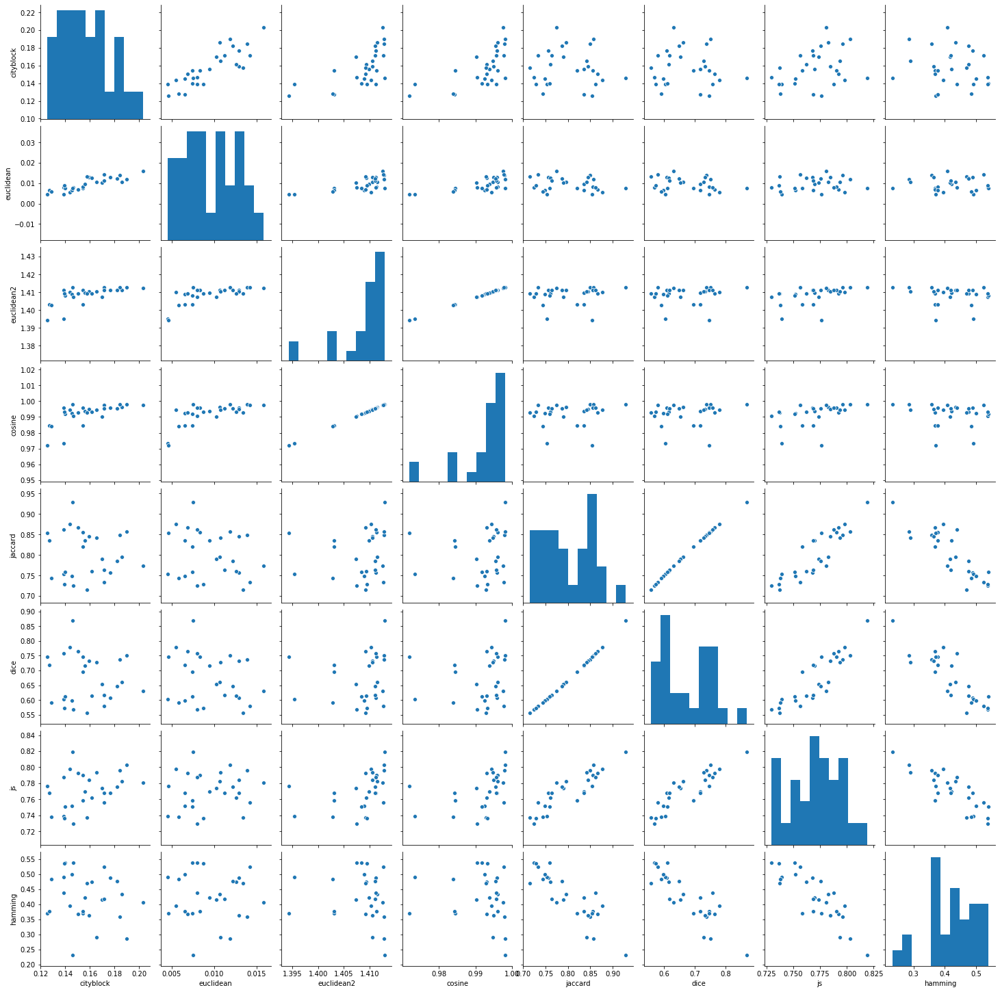

In [58]:
sns.pairplot(SAMPLE)

In [59]:
PAIRS.sort_values('cosine').head(20).style.background_gradient('YlGn')

,,cityblock,euclidean,euclidean2,cosine,jaccard,dice,js,hamming
doc_a,doc_b,,,,,,,,
4,6,0.125455,0.004596,1.394252,0.971970,0.854076,0.745317,0.776466,0.370977
1,6,0.138597,0.004561,1.395302,0.973434,0.753278,0.604207,0.739293,0.490840
5,6,0.128530,0.005784,1.402815,0.983945,0.743106,0.591224,0.738047,0.483289
4,5,0.127022,0.006534,1.403112,0.984362,0.835832,0.717966,0.768416,0.377001
1,2,0.154218,0.007465,1.403121,0.984374,0.820022,0.694947,0.758490,0.368873
6,8,0.169676,0.010266,1.407277,0.990215,0.790168,0.653121,0.773684,0.416282
1,7,0.146720,0.007999,1.407471,0.990487,0.724413,0.567906,0.729618,0.537795
5,7,0.139768,0.007423,1.408350,0.991725,0.758877,0.611444,0.751216,0.538001
1,5,0.145196,0.006533,1.408895,0.992492,0.748556,0.598154,0.751895,0.500000


#### Hierarchical Cluster

In [60]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [61]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = DOC.Title.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=list(labels), 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 432x288 with 0 Axes>

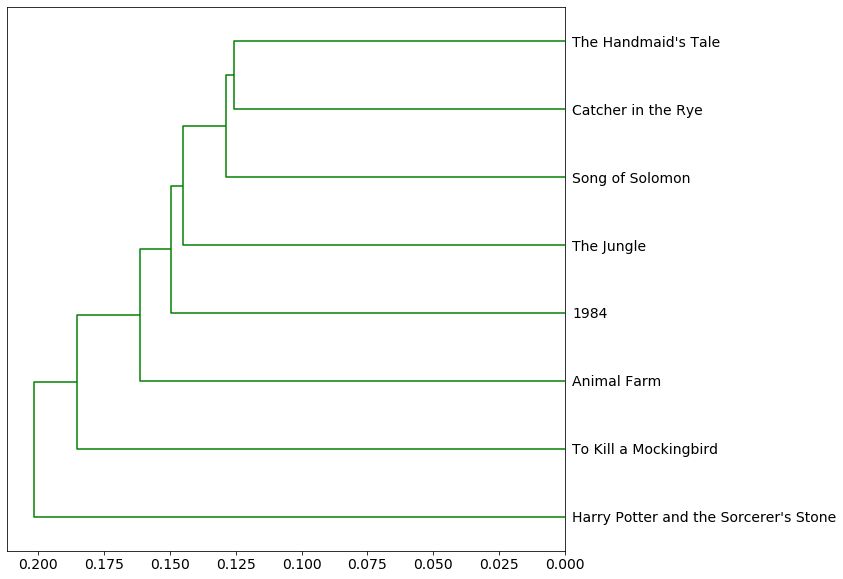

In [62]:
hca(PAIRS.cityblock, color_thresh=1)

<Figure size 432x288 with 0 Axes>

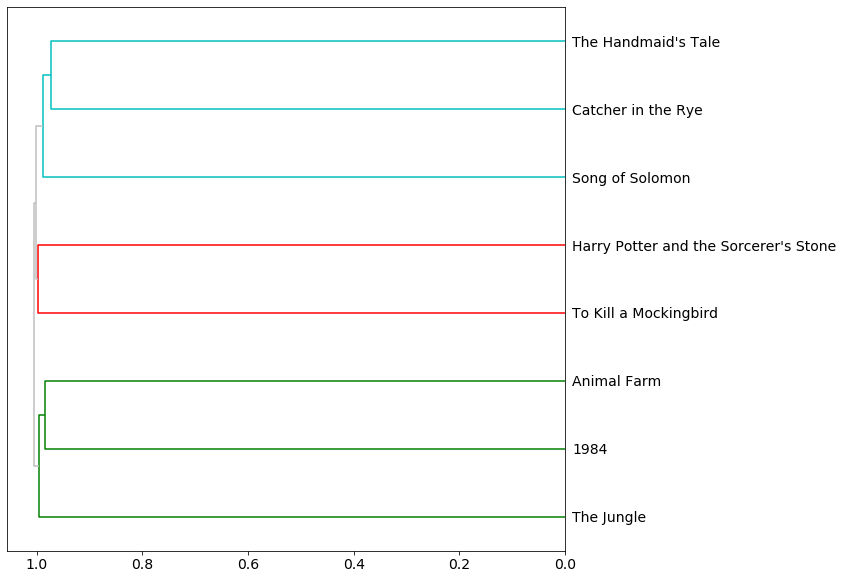

In [63]:
hca(PAIRS.cosine, color_thresh=1)

<Figure size 432x288 with 0 Axes>

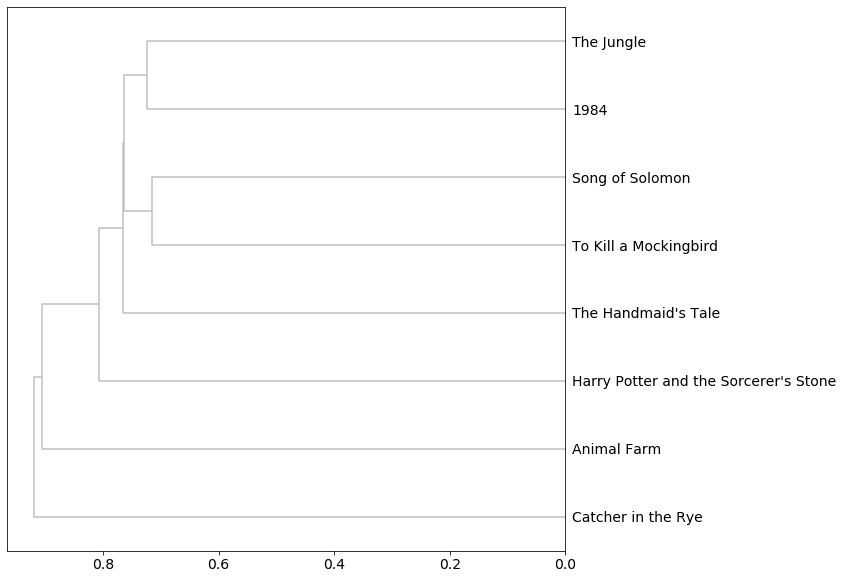

In [64]:
hca(PAIRS.jaccard, color_thresh=.6)

<Figure size 432x288 with 0 Axes>

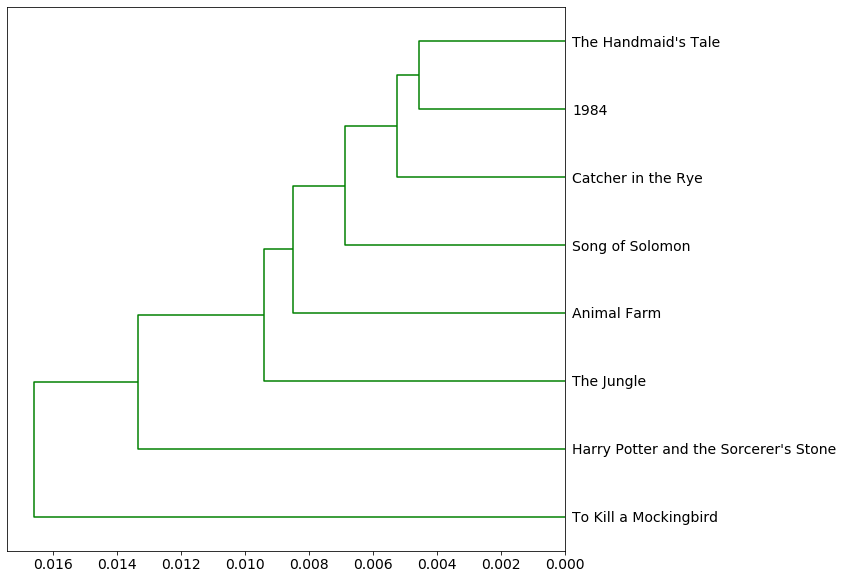

In [65]:
hca(PAIRS.euclidean, color_thresh=.3)

<Figure size 432x288 with 0 Axes>

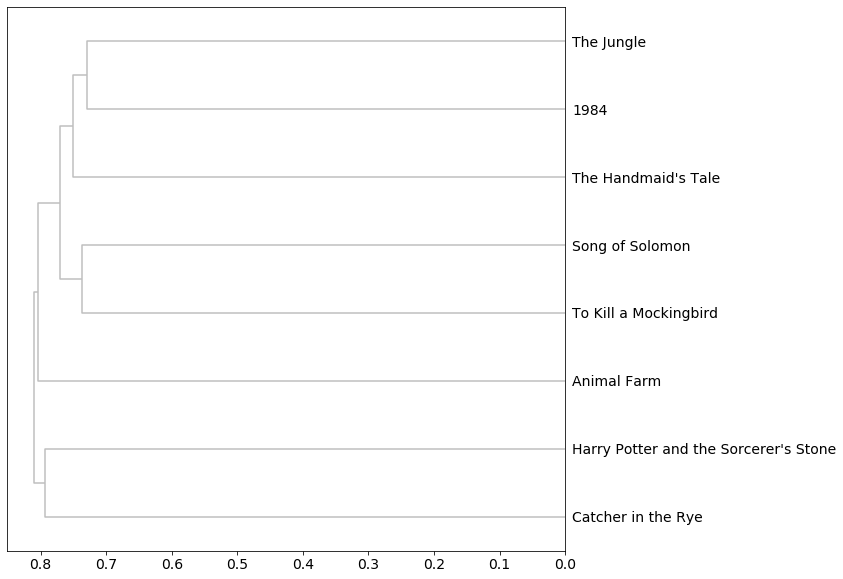

In [66]:
hca(PAIRS.js, color_thresh=.6)

<Figure size 432x288 with 0 Axes>

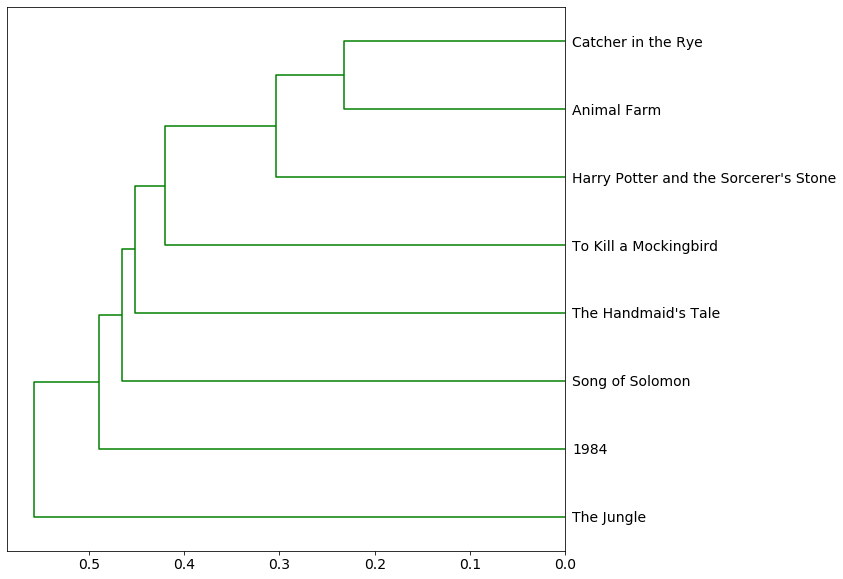

In [67]:
hca(PAIRS.hamming, color_thresh=.6)

In [68]:
PAIRS.to_csv('Distances.csv')

## Part 4: PCA

#### Updated Configurations

In [69]:
from sklearn.decomposition import PCA
from scipy.linalg import norm
import plotly_express as px

sns.set(style='ticks')

#### Read In Checkpointed Tables

In [70]:
VOCAB = pd.read_csv("VOCAB2.csv").set_index('term_id')
TOKEN = pd.read_csv("TOKEN2.csv", dtype = {'Author':'str','Title':'str','chap_num':'int', 'para_num':'int', 'sent_num':'int', 'token_num':'int',\
                                           'book_id':'int','pos_tuple':'str','pos':'str','token_str':'str',
                                           'term_str':'str','term_id': 'int'}).set_index('term_id')

#### Reducing TOKEN and VOCAB table size for PCA

In [71]:
#remove personal pronouns from VOCAB
VOCAB = VOCAB[VOCAB.pos != 'NNP']
VOCAB = VOCAB[VOCAB.pos != 'NNPS']

In [72]:
# sort VOCAB table by descending tfidf_sum
VOCAB = VOCAB.sort_values('tfidf_sum', ascending=False)
VOCAB

,term_rank,index,term_str,n,num,stop,p_stem,pos,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h,df,idf,tfidf_sum
term_id,,,,,,,,,,,,,,,,,,,
13110,177,376989,milkman,547,0,0,milkman,NN,NN,166,0.022570,96819,90802,3.746575,0.000740,0.007695,2,0.60206,0.002850
9398,282,217884,guitar,309,0,0,guitar,NN,NN,246,0.012750,87138,76014,3.136409,0.000418,0.004692,1,0.90309,0.002413
8999,344,210834,goddam,251,0,0,goddam,NN,NN,289,0.010356,86344,72539,2.993027,0.000340,0.003913,2,0.60206,0.002067
9434,473,218430,guy,173,0,0,guy,NN,NN,353,0.007138,81829,61069,2.519764,0.000234,0.002822,2,0.60206,0.001433
23771,1005,710733,windmill,72,0,0,windmil,NN,NN,451,0.002971,72360,32472,1.339825,0.000097,0.001298,2,0.60206,0.001422
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12396,2235,361219,lower,27,0,0,lower,VBZ,VBZ,496,0.001114,60345,13392,0.552566,0.000037,0.000538,8,0.00000,0.000000
8244,578,190533,foot,137,0,0,foot,NN,NN,386,0.005653,79186,52882,2.181961,0.000185,0.002298,8,0.00000,0.000000
13032,579,375498,met,137,0,0,met,NN,NN,386,0.005653,79323,52882,2.181961,0.000185,0.002298,8,0.00000,0.000000


In [73]:
#filter out all terms with a tfidf sum of 0
VOCAB2 =  VOCAB[VOCAB['tfidf_sum'] > 0]

In [74]:
#reduce frame to 15k terms
VOCAB_min = VOCAB2.iloc[0:10000]

VOCAB_min = VOCAB_min[['term_str', 'pos_max',]].reset_index()
VOCAB_min

,term_id,term_str,pos_max
0,13110,milkman,NN
1,9398,guitar,NN
2,8999,goddam,NN
3,9434,guy,NN
4,23771,windmill,NN
...,...,...,...
9995,6382,dreaming,VBG
9996,9751,hearse,NN
9997,5238,darkened,NN
9998,631,alien,JJ


In [75]:
TOKEN_reset = TOKEN.reset_index().copy()

In [76]:
#merge TOKEN and VOCAB tables together
TOKEN2 = pd.merge(TOKEN_reset,VOCAB_min, how = "inner", on = "term_id")

In [77]:
TOKEN2 = TOKEN2.set_index(OHCO)

In [78]:
#checkpoint
TOKEN2.to_csv('TOKEN3.csv')

#### TFIDF on reduced tables

In [79]:
bag = BOOKS
tfidf_reduced = TFIDF_gen(TOKEN2, bag, count_method, tf_method, idf_method)

TF method: sum
IDF method: standard


In [80]:
tfidf_reduced

term_id                                                   2         3      \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000139   
                Animal Farm                            0.000050  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000059  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000521  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000000   
Upton Sinclair  The Jungle                             0.000012  0.000000   

term_id                                                   4         15     \
Author          Title                                                       
George Orwell   1984                                   0.000697  0.000093   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000000   
Upton Sinclair  The Jungle                             0.000000  0.000000   

term_id                                                   32        46     \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000104  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000091   
Upton Sinclair  The Jungle                             0.000000  0.000000   

term_id                                                   49        51     \
Author          Title                                                       
George Orwell   1984                                   0.000093  0.000062   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000000  0.000030   
Upton Sinclair  The Jungle                             0.000000  0.000000   

term_id                                                   52        56     \
Author          Title                                                       
George Orwell   1984                                   0.000000  0.000000   
                Animal Farm                            0.000000  0.000000   
Harper Lee      To Kill a Mockingbird                  0.000000  0.000000   
J.D. Salinger   Catcher in the Rye                     0.000000  0.000000   
J.K. Rowling    Harry Potter and the Sorcerer's Stone  0.000000  0.000000   
Margaret Atwood The Handmaid's Tale                    0.000000  0.000000   
Toni Morrison   Song of Solomon                        0.000183  0.000091   
Upton Sinclair  The Jungle                             0.000000  0.000000   

term_id                                                ...     24199  \
Author          Title                                  ...             
G

#### Pre-processing

In [81]:
#normalize
tfidf = tfidf_reduced.apply(lambda x: x / norm(x), 1)

#### Covariance Matrix

In [82]:
#COV
%time cov_tfidf = tfidf_reduced.cov()
cov_tfidf

Wall time: 673 ms


term_id,2,3,4,15,32,46,49,51,52,56,...,24199,24200,24212,24217,24221,24228,24231,24232,24234,24235
term_id,,,,,,,,,,,,,,,,,,,,,
2,3.226946e-08,-1.596670e-09,-7.983350e-09,-1.064447e-09,-1.186741e-09,-1.047683e-09,-1.064447e-09,-1.058859e-09,-2.095367e-09,-1.047683e-09,...,-2.128893e-09,5.530691e-09,-1.304358e-09,-1.526702e-09,8.194611e-09,-2.670149e-09,8.194611e-09,7.477387e-09,2.553214e-09,5.018049e-09
3,-1.596670e-09,2.428601e-09,1.214300e-08,1.619067e-09,-2.578689e-10,-2.276528e-10,1.619067e-09,1.003494e-09,-4.553055e-10,-2.276528e-10,...,3.238134e-09,-5.689798e-10,5.711785e-10,-3.559699e-10,-3.240602e-10,-5.802009e-10,-3.240602e-10,-1.371752e-09,-2.549811e-10,-3.127403e-10
4,-7.983350e-09,1.214300e-08,6.071502e-08,8.095336e-09,-1.289345e-09,-1.138264e-09,8.095336e-09,5.017469e-09,-2.276528e-09,-1.138264e-09,...,1.619067e-08,-2.844899e-09,2.855893e-09,-1.779850e-09,-1.620301e-09,-2.901005e-09,-1.620301e-09,-6.858761e-09,-1.274906e-09,-1.563701e-09
15,-1.064447e-09,1.619067e-09,8.095336e-09,1.079378e-09,-1.719126e-10,-1.517685e-10,1.079378e-09,6.689959e-10,-3.035370e-10,-1.517685e-10,...,2.158756e-09,-3.793199e-10,3.807857e-10,-2.373133e-10,-2.160401e-10,-3.868006e-10,-2.160401e-10,-9.145015e-10,-1.699874e-10,-2.084935e-10
32,-1.186741e-09,-2.578689e-10,-1.289345e-09,-1.719126e-10,1.341646e-09,-1.692053e-10,-1.719126e-10,-1.710102e-10,-3.384105e-10,-1.692053e-10,...,-3.438252e-10,1.198144e-09,-2.241665e-10,-2.645783e-10,-2.408611e-10,-4.312403e-10,-2.408611e-10,-1.019569e-09,-1.895174e-10,-2.324474e-10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24228,-2.670149e-09,-5.802009e-10,-2.901005e-09,-3.868006e-10,-4.312403e-10,-3.807091e-10,-3.868006e-10,-3.847701e-10,-7.614182e-10,-3.807091e-10,...,-7.736012e-10,-2.257245e-10,4.109543e-10,1.235354e-09,-5.419335e-10,6.791986e-09,-5.419335e-10,-3.534464e-10,-4.264110e-10,7.707087e-10
24231,8.194611e-09,-3.240602e-10,-1.620301e-09,-2.160401e-10,-2.408611e-10,-2.126378e-10,-2.160401e-10,-2.149060e-10,-4.252756e-10,-2.126378e-10,...,-4.320802e-10,1.534807e-09,-2.817068e-10,-3.324917e-10,2.118806e-09,-5.419335e-10,2.118806e-09,1.543798e-09,5.690006e-10,1.322215e-09
24232,7.477387e-09,-1.371752e-09,-6.858761e-09,-9.145015e-10,-1.019569e-09,-3.025860e-10,-9.145015e-10,-7.105297e-10,-6.051720e-10,-3.025860e-10,...,-1.829003e-09,1.020444e-09,-9.636383e-10,-8.088633e-10,1.543798e-09,-3.534464e-10,1.543798e-09,1.110636e-08,2.423582e-09,9.702906e-10


In [83]:
cov_tfidf.iloc[:5,:10].style.background_gradient()

term_id,2,3,4,15,32,46,49,51,52,56
term_id,,,,,,,,,,
2,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
3,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000
4,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000
15,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000
32,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000


#### Matrix Decomposition

In [84]:
#decompose
from scipy.linalg import eigh as eig

%time eig_vals,eig_vecs = eig(cov_tfidf)

Wall time: 1min 17s


In [85]:
term_idx = cov_tfidf.index

In [86]:
eig_vec = pd.DataFrame(eig_vecs, index = term_idx, columns = term_idx)
eig_val = pd.DataFrame(eig_vals, index = term_idx, columns = ['eig_val'])
eig_val.index.name = 'term_id'

In [87]:
eig_vec.iloc[:5, :10].style.background_gradient()

term_id,2,3,4,15,32,46,49,51,52,56
term_id,,,,,,,,,,
2,-0.000022,-0.001126,-0.000564,0.000000,0.016827,0.015477,0.000000,-0.031190,0.000000,0.000000
3,-0.029532,-0.035781,0.041898,0.053731,0.533064,0.300317,-0.017571,-0.110382,0.012974,0.030842
4,0.308911,0.279689,-0.497455,-0.215579,0.139899,0.031281,0.028633,-0.002520,0.058854,0.110774
15,-0.383962,0.323008,0.379907,-0.421862,0.049175,0.095581,-0.021520,-0.072446,0.000227,0.067100
32,0.166715,0.570508,0.115893,0.336435,-0.059670,0.063572,-0.033534,-0.015571,-0.004642,0.031382


In [88]:
eig_val.iloc[:10]

,eig_val
term_id,
2,-1.206045e-19
3,-9.627146e-20
4,-8.507274e-20
15,-5.512615e-20
32,-4.371284e-20
46,-3.348470e-20
49,-2.567919e-20
51,-1.220028e-20
52,-1.190797e-20


In [89]:
eig_pairs = eig_val.join(eig_vec.T)

In [90]:
#variance
eig_pairs['exp_var'] = np.round((eig_pairs.eig_val / eig_pairs.eig_val.sum()) * 100, 2)

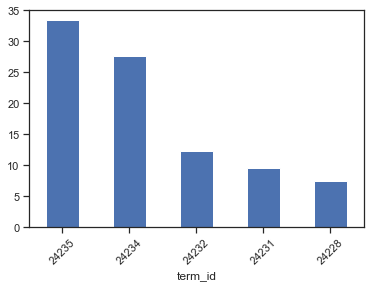

In [91]:
eig_pairs.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

In [92]:
#top 10 components
top = eig_pairs.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
top.index.name = 'comp_id'
top.index = ["PC{}".format(i) for i in top.index.tolist()]

In [93]:
top

,eig_val,2,3,4,15,32,46,49,51,52,...,24200,24212,24217,24221,24228,24231,24232,24234,24235,exp_var
PC0,7.115075e-05,0.001654,-6.107485e-05,-0.000305,-0.000041,-6.456498e-05,-0.002769,-0.000041,-0.000950,-0.005538,...,-0.000281,-0.000044,-0.000688,-0.000064,-0.000023,-0.000064,0.008280,0.001928,-0.000047,33.40
PC1,5.905789e-05,-0.005680,-1.277378e-03,-0.006387,-0.000852,-9.219428e-04,0.002899,-0.000852,0.000399,0.005798,...,-0.001093,-0.001048,-0.000341,-0.001661,-0.002068,-0.001661,0.007326,0.001113,-0.001452,27.72
PC2,2.608622e-05,0.030828,-1.273766e-03,-0.006369,-0.000849,-7.993535e-04,0.000160,-0.000849,-0.000513,0.000320,...,0.007116,-0.000880,-0.000725,0.008156,-0.001581,0.008156,0.009638,0.002806,0.005174,12.25
PC3,2.039956e-05,0.015585,-1.791039e-03,-0.008955,-0.001194,-4.360350e-03,0.000346,-0.001194,-0.000681,0.000692,...,-0.003827,-0.001805,-0.002066,0.003117,-0.006248,0.003117,0.003368,0.001263,0.001037,9.58
PC4,1.583204e-05,0.003526,-2.846550e-03,-0.014233,-0.001898,7.074142e-03,0.000031,-0.001898,-0.001255,0.000063,...,0.006595,-0.002920,-0.003807,0.000723,-0.014175,0.000723,-0.002277,0.000322,-0.001881,7.43
PC5,1.229499e-05,0.003401,-1.132564e-02,-0.056628,-0.007550,2.291439e-03,0.000113,-0.007550,-0.004996,0.000225,...,0.004368,-0.003199,0.001597,0.000690,0.013840,0.000690,0.004534,0.000273,0.002767,5.77
PC6,8.195402e-06,-0.003195,-7.956707e-03,-0.039784,-0.005304,-1.906433e-03,-0.000216,-0.005304,-0.003608,-0.000431,...,-0.005358,0.002766,0.006646,-0.000980,-0.004161,-0.000980,-0.002899,-0.000448,-0.001347,3.85
PC7,4.011139e-26,0.000000,-7.187278e-06,-0.000010,0.000003,-2.462855e-08,0.000006,-0.000018,-0.000001,0.000057,...,-0.006769,-0.015658,-0.010247,-0.002106,0.011233,-0.001872,0.001364,-0.009081,-0.011778,0.00
PC8,3.995491e-26,0.000000,5.636193e-07,0.000002,0.000005,7.193220e-06,0.000013,-0.000013,0.000005,0.000031,...,0.011725,0.012097,-0.013271,0.004447,-0.011013,0.010928,0.001294,-0.006718,-0.004349,0.00
PC9,3.995743e-26,0.000000,2.373636e-07,0.000002,-0.000001,-6.094213e-06,-0.000021,0.000013,-0.000003,0.000035,...,0.001753,-0.018303,-0.003619,-0.003299,-0.003284,-0.013223,0.002139,0.006697,-0.016288,0.00


#### Loadings

In [94]:
#loadings
LOADINGS = top[term_idx].T
LOADINGS.index.name = 'term_id'

In [95]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
2,0.001654,-0.005680,0.030828,0.015585,0.003526,0.003401,-0.003195,0.000000,0.000000,0.000000
3,-0.000061,-0.001277,-0.001274,-0.001791,-0.002847,-0.011326,-0.007957,-0.000007,0.000001,0.000000
4,-0.000305,-0.006387,-0.006369,-0.008955,-0.014233,-0.056628,-0.039784,-0.000010,0.000002,0.000002
15,-0.000041,-0.000852,-0.000849,-0.001194,-0.001898,-0.007550,-0.005304,0.000003,0.000005,-0.000001
32,-0.000065,-0.000922,-0.000799,-0.004360,0.007074,0.002291,-0.001906,-0.000000,0.000007,-0.000006


In [96]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
2,0.001654,-0.005680,0.030828,0.015585,0.003526,0.003401,-0.003195,0.000000,0.000000,0.000000
3,-0.000061,-0.001277,-0.001274,-0.001791,-0.002847,-0.011326,-0.007957,-0.000007,0.000001,0.000000
4,-0.000305,-0.006387,-0.006369,-0.008955,-0.014233,-0.056628,-0.039784,-0.000010,0.000002,0.000002
15,-0.000041,-0.000852,-0.000849,-0.001194,-0.001898,-0.007550,-0.005304,0.000003,0.000005,-0.000001
32,-0.000065,-0.000922,-0.000799,-0.004360,0.007074,0.002291,-0.001906,-0.000000,0.000007,-0.000006


In [97]:
LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [98]:
lb0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
lb0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
lb1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
lb1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

In [99]:
print('Books PC0+', lb0_pos)
print('Books PC0-', lb0_neg)
print('Books PC1+', lb1_pos)
print('Books PC1-', lb1_neg)

Books PC0+ milkman guitar porter shit ryna navel aint nigger tommys cave
Books PC0- goddam guy guys lousy jane holden baloney hell wouldve kidding
Books PC1+ windmill yeh scout professor moira comrades quidditch ter comrade telescreen
Books PC1- milkman guitar goddam guy guys lousy jane holden baloney hell


#### New Subspace

In [100]:
#new subspace
DCM = tfidf_reduced.dot(top[term_idx].T)
DCM

#define table for export
exportdcm= DCM.copy().reset_index().set_index(['Author','Title'])

In [101]:
#export out pca_loadings table
exportdcm.to_csv('PCA_Loadings.csv')

In [102]:
DCM = DCM.merge(LIB, on='Title')
#DCM = DCM[['Title', 'PC0', 'PC1', 'PC2', 'PC3', 'PC4', 'PC5', 'PC6', 'PC7', 'PC8',
 #      'PC9', 'book_id_x', 'Author_x']]
DCM.rename({"book_id_x":"book_id", 'Author_x':'Author'})
DCM['doc'] = DCM.apply(lambda x: "{}-{}".format( x.Author, x.Title), 1)

In [103]:
DCM.head().style.background_gradient()

,Title,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,book_id,Author,doc
0,1984,-0.000087,-0.000883,-0.000994,-0.000817,-0.001770,-0.006245,-0.004259,0.000010,-0.000000,-0.000019,1,George Orwell,George Orwell-1984
1,Animal Farm,-0.000183,-0.002119,-0.005967,0.009638,0.001908,0.002296,-0.001572,0.000010,-0.000000,-0.000019,2,George Orwell,George Orwell-Animal Farm
2,To Kill a Mockingbird,-0.000179,-0.000774,-0.000734,-0.004992,0.008061,0.002652,-0.002040,0.000010,-0.000000,-0.000019,8,Harper Lee,Harper Lee-To Kill a Mockingbird
3,Catcher in the Rye,0.016572,0.014573,0.000945,0.001560,0.000646,0.000810,-0.001102,0.000010,-0.000000,-0.000019,3,J.D. Salinger,J.D. Salinger-Catcher in the Rye
4,Harry Potter and the Sorcerer's Stone,-0.000116,-0.002370,0.012114,0.004437,0.001109,0.001204,-0.001416,0.000010,-0.000000,-0.000019,4,J.K. Rowling,J.K. Rowling-Harry Potter and the Sorcerer's Stone


In [104]:
#define table for export
exportdcm2 = DCM.copy().reset_index().set_index(['Author','Title']).drop(['index'], axis = 1)

In [105]:
#export out PCA_doc table
exportdcm2.to_csv('PCA_Doc.csv')

#### Export out table

In [106]:
import plotly.express as px
#visual
def vis_pcs(M, a, b, label = 'Title',prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='Title', marginal_x='box',
                        title= "PC"+str(a)+ " and "+"PC"+str(b)+ " Scatterplot by "+ label)
    fig.show()

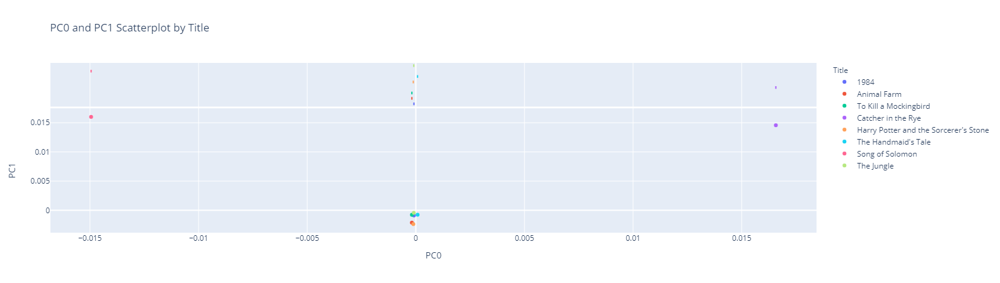

In [107]:
vis_pcs(DCM, 0, 1)

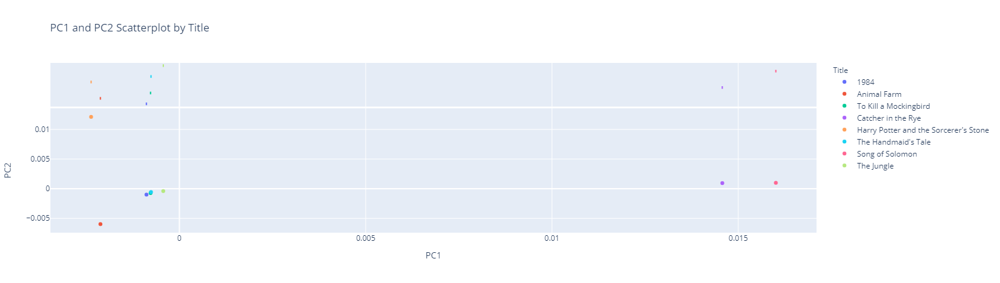

In [108]:
vis_pcs(DCM, 1, 2)

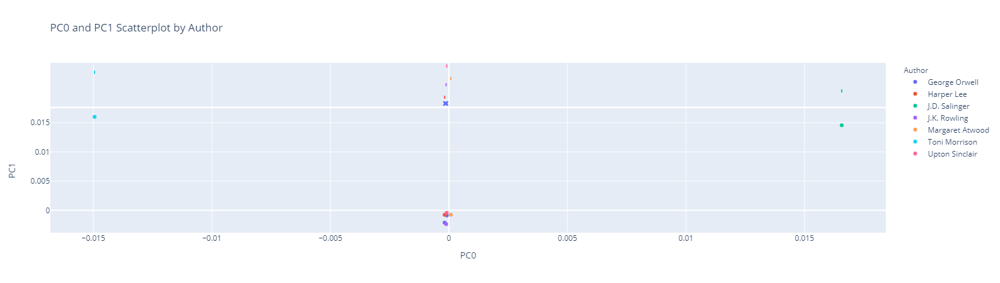

In [109]:
vis_pcs(DCM, 0, 1, label = "Author")

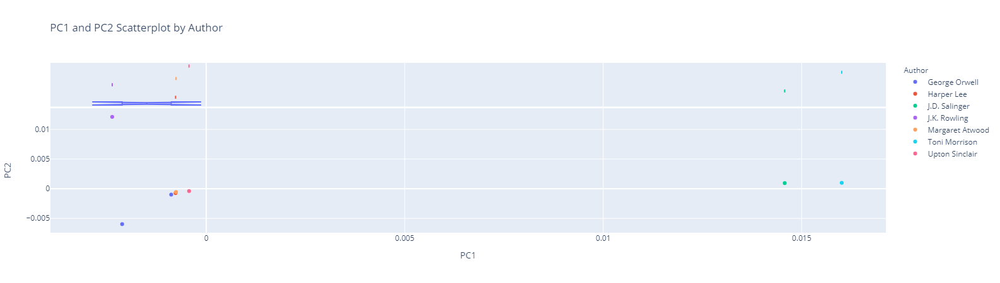

In [110]:
vis_pcs(DCM, 1, 2, label =  "Author")

## Part 5: LDA

#### Updated Configurations

In [111]:
n_terms = 10000 # performing LDA on reduced tables
n_topics = 30
max_iter = 5

In [112]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

#### Token Table to table of Paragraphs and Books

In [113]:
PARAS = TOKEN2[TOKEN2.pos.str.match(r'^NNS?$')]\
    .groupby(OHCO[:4]).term_str_x\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str_x':'para_str'})

In [114]:
BOOKS = TOKEN2[TOKEN2.pos.str.match(r'^NNS?$')]\
    .groupby(OHCO[:2]).term_str_x\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str_x':'book_str'})

In [115]:
#export out table
PARAS.to_csv('Doc_topics2.csv')

#### Create Vector Space

In [116]:
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(PARAS.para_str)
TERMS = tfv.get_feature_names()

In [117]:
tfv2 = CountVectorizer(max_features=n_terms, stop_words='english')
tf2 = tfv.fit_transform(BOOKS.book_str)
TERMS2 = tfv.get_feature_names()

#### LDA Models

In [118]:
lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)
lda2 = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

#### Theta

In [119]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=PARAS.index)
THETA.columns.name = 'topic_id'

THETA2 = pd.DataFrame(lda2.fit_transform(tf2), index=BOOKS.index)
THETA2.columns.name = 'topic_id'

In [120]:
THETA2.sample(8).style.background_gradient()

,topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
Author,Title,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Toni Morrison,Song of Solomon,0.000003,0.000003,0.830106,0.000003,0.000003,0.000003,0.011610,0.000003,0.000003,0.000003,0.000003,0.000003,0.008699,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.057801,0.000003,0.008316,0.083390,0.000003,0.000003
George Orwell,Animal Farm,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.000010,0.999698,0.000010,0.000010,0.000010
Margaret Atwood,The Handmaid's Tale,0.000004,0.000004,0.984268,0.000004,0.000004,0.000004,0.009339,0.000004,0.000004,0.000004,0.000004,0.000004,0.004149,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.002138,0.000004,0.000004,0.000004
Harper Lee,To Kill a Mockingbird,0.000004,0.000004,0.061408,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.000004,0.836818,0.000004,0.000004,0.101669,0.000004,0.000004
J.D. Salinger,Catcher in the Rye,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.999828,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006,0.000006
Upton Sinclair,The Jungle,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.995610,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.000002,0.004093,0.000002,0.000002,0.000002,0.000237,0.000002,0.000002,0.000002,0.000002,0.000002
George Orwell,1984,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.000003,0.999904,0.000003,0.000003
J.K. Rowling,Harry Potter and the Sorcerer's Stone,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.929289,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.070575,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005,0.000005


#### Phi

In [121]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [122]:
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
22,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333
6079,0.033333,0.033333,0.033333,2.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333
aback,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,4.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333
abandoned,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,2.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333
abasement,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333


In [123]:
PHI2 = pd.DataFrame(lda2.components_, columns=TERMS)
PHI2.index.name = 'topic_id'
PHI2.columns.name  = 'term_str'

In [124]:
PHI2.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
22,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333
6079,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,3.033333,0.033333,0.033333
aback,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.032767,0.033333,1.027292,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.039941,0.033333,0.033333,0.033333,0.033333,0.033333,1.033333,2.033333,0.033333,0.033333
abandoned,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,2.033333,0.033333,0.033333
abasement,0.033333,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,2.033333,0.033333,0.033333


#### Results

In [125]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [126]:
TOPICS2 = PHI2.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [127]:
#export out topic_term_counts table
TOPICS.to_csv('Topic_term_count.csv')

In [128]:
TOPICS2.head(10)

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
1,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
2,woman,people,women,hair,car,baby,gold,arms,fingers,girl
3,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
4,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
5,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
6,hell,goddam,guy,stuff,guys,kid,damn,girl,people,school
7,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked
8,zoo,foreknowledge,flavours,fleas,fled,fleet,flesh,flew,flick,flicked


In [129]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x[:7].astype('str')), 1)

In [130]:
TOPICS2['label'] = TOPICS2.apply(lambda x: str(x.name) + ' ' + ' '.join(x[:7].astype('str')), 1)

In [131]:
TOPICS.label

topic_id
0              0 mirror wonder fence goin earth sea huh
1          1 person girl truck dollars thank sex people
2            2 people car aint lady doesnt daddy street
3     3 fingers rooms people moment courthouse manne...
4       4 porch cloak hair people corridor moment woman
5     5 dogs snake smiled knife whos grandmother hos...
6             6 youre guy goddam guys hell stuff school
7                    7 yeah son okay bones cup law mans
8            8 parents family phone hall wont arm sight
9              9 hed crazy sake office people ass dream
10       10 words tears family agent women moment yards
11                   11 thats em kid gonna wand cat hey
12          12 gold theyd lets suh dear crate yesterday
13             13 stuff pocket ter ya cigarette try yer
14        14 tea lots uncle guy card twins conversation
15          15 hell weve cars street people judge hurry
16    16 smile people church wine reckon words comrades
17              17 broom scout bet trol

In [132]:
TOPICS2.label

topic_id
0     0 zoo foreknowledge flavours fleas fled fleet ...
1     1 zoo foreknowledge flavours fleas fled fleet ...
2               2 woman people women hair car baby gold
3     3 zoo foreknowledge flavours fleas fled fleet ...
4     4 zoo foreknowledge flavours fleas fled fleet ...
5     5 zoo foreknowledge flavours fleas fled fleet ...
6                 6 hell goddam guy stuff guys kid damn
7     7 zoo foreknowledge flavours fleas fled fleet ...
8     8 zoo foreknowledge flavours fleas fled fleet ...
9     9 zoo foreknowledge flavours fleas fled fleet ...
10       10 dollars people family city women job street
11    11 zoo foreknowledge flavours fleas fled fleet...
12           12 people hed school wand cloak ter moment
13    13 zoo foreknowledge flavours fleas fled fleet...
14    14 zoo foreknowledge flavours fleas fled fleet...
15    15 zoo foreknowledge flavours fleas fled fleet...
16    16 zoo foreknowledge flavours fleas fled fleet...
17    17 zoo foreknowledge flavours fle

#### Topics by Doc Weight

In [133]:
TOPICS['doc_weight_sum'] = THETA.sum()

In [134]:
TOPICS2['doc_weight_sum'] = THETA2.sum()

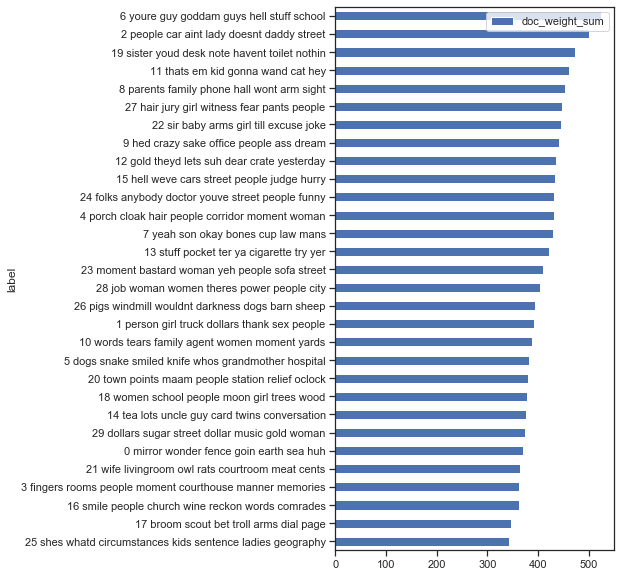

In [135]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

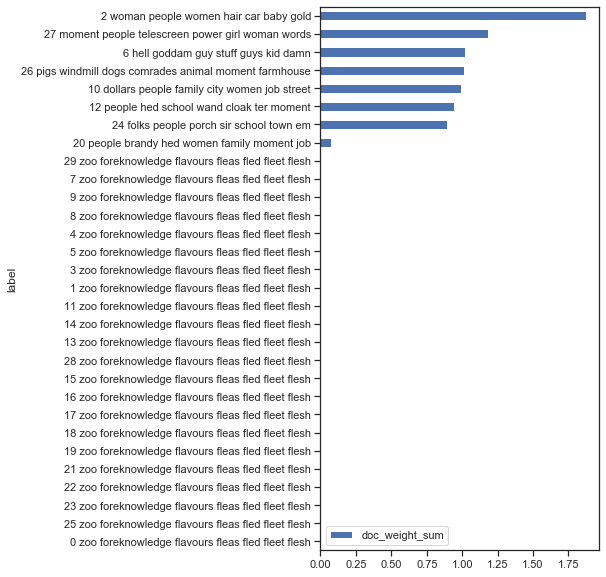

In [136]:
TOPICS2.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

In [137]:
topic_cols = [t for t in range(n_topics)]

#### Extract Top Topic ID by document

In [138]:
docs = THETA.reset_index().set_index(['Title']+OHCO[:4])\
    .groupby('Title')[topic_cols].mean()\
    .T                                            
docs.index.name = 'topic_id'
docs['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [139]:
docs

Title,1984,Animal Farm,Catcher in the Rye,Harry Potter and the Sorcerer's Stone,Song of Solomon,The Handmaid's Tale,The Jungle,To Kill a Mockingbird,topterms
topic_id,,,,,,,,,
0,0.034541,0.035002,0.022459,0.032071,0.029647,0.037306,0.018353,0.031147,mirror wonder fence goin earth sea huh woman a...
1,0.041760,0.020110,0.030138,0.025468,0.028787,0.027947,0.048331,0.031805,person girl truck dollars thank sex people cro...
2,0.037837,0.016338,0.027328,0.035275,0.061242,0.040684,0.025861,0.047637,people car aint lady doesnt daddy street women...
3,0.066194,0.025939,0.019573,0.025256,0.025574,0.035390,0.029511,0.022748,fingers rooms people moment courthouse manner ...
4,0.039180,0.017780,0.023130,0.041068,0.032128,0.037564,0.030994,0.038784,porch cloak hair people corridor moment woman ...
5,0.029048,0.042625,0.020122,0.031557,0.041581,0.024402,0.031069,0.031849,dogs snake smiled knife whos grandmother hospi...
6,0.022213,0.009673,0.134167,0.028815,0.035766,0.034819,0.027364,0.031216,youre guy goddam guys hell stuff school balone...
7,0.036667,0.040500,0.025898,0.029573,0.048842,0.029848,0.021994,0.041381,yeah son okay bones cup law mans evidence chil...
8,0.022178,0.030877,0.054378,0.043892,0.033562,0.034609,0.034126,0.031609,parents family phone hall wont arm sight eleva...


In [140]:
Theta_doc = THETA.groupby('Title').sum().T

In [141]:
#find max val for each document
maxval = Theta_doc.idxmax()
maxval = maxval.to_frame().reset_index()
maxval = maxval.rename({0:'topic_id'}, axis = 1)
maxval

,Title,topic_id
0,1984,3
1,Animal Farm,26
2,Catcher in the Rye,6
3,Harry Potter and the Sorcerer's Stone,12
4,Song of Solomon,2
5,The Handmaid's Tale,19
6,The Jungle,28
7,To Kill a Mockingbird,2


In [142]:
#merge tables to get final doc_topic table
doc = docs.reset_index()
top2term = doc[['topic_id','topterms']]
doc_term = pd.merge(maxval,top2term, on = 'topic_id').set_index('Title')
doc_term

,topic_id,topterms
Title,,
1984,3,fingers rooms people moment courthouse manner ...
Animal Farm,26,pigs windmill wouldnt darkness dogs barn sheep...
Catcher in the Rye,6,youre guy goddam guys hell stuff school balone...
Harry Potter and the Sorcerer's Stone,12,gold theyd lets suh dear crate yesterday eh ca...
Song of Solomon,2,people car aint lady doesnt daddy street women...
To Kill a Mockingbird,2,people car aint lady doesnt daddy street women...
The Handmaid's Tale,19,sister youd desk note havent toilet nothin bat...
The Jungle,28,job woman women theres power people city union...


In [143]:
doc_term.to_csv('doc_topic.csv')

#### Topics by Author

##### Paragraph Level

In [144]:
AUTHORS = THETA.reset_index().set_index(['Author']+OHCO[:4])\
    .groupby('Author')[topic_cols].mean()\
    .T                                            
AUTHORS.index.name = 'topic_id'

In [145]:
AUTHORS['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [146]:
AUTHORS.sort_values('George Orwell', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
26,0.060954,0.027117,0.018546,0.029887,0.036431,0.027002,0.032361,pigs windmill wouldnt darkness dogs barn sheep terror mercy club
3,0.057525,0.022748,0.019573,0.025256,0.035390,0.025574,0.029511,fingers rooms people moment courthouse manner memories ticket van sack
27,0.047295,0.046397,0.021018,0.031186,0.034223,0.038566,0.029509,hair jury girl witness fear pants people wire bank moment
10,0.044500,0.022841,0.013987,0.028726,0.035569,0.028034,0.059192,words tears family agent women moment yards darkness dozen arms
12,0.040141,0.034513,0.034522,0.045382,0.027210,0.036545,0.022782,gold theyd lets suh dear crate yesterday eh cave forest
16,0.037656,0.032827,0.018009,0.027031,0.031978,0.027984,0.029339,smile people church wine reckon words comrades earth prison county
7,0.037492,0.041381,0.025898,0.029573,0.029848,0.048842,0.021994,yeah son okay bones cup law mans evidence child woman
1,0.037097,0.031805,0.030138,0.025468,0.027947,0.028787,0.048331,person girl truck dollars thank sex people crowd bucks wind
0,0.034641,0.031147,0.022459,0.032071,0.037306,0.029647,0.018353,mirror wonder fence goin earth sea huh woman arms girl


In [147]:
AUTHORS.sort_values('J.D. Salinger', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
6,0.019512,0.031216,0.134167,0.028815,0.034819,0.035766,0.027364,youre guy goddam guys hell stuff school baloney movie damn
9,0.026183,0.034175,0.055534,0.034441,0.031765,0.033333,0.036426,hed crazy sake office people ass dream son guy strike
8,0.024051,0.031609,0.054378,0.043892,0.034609,0.033562,0.034126,parents family phone hall wont arm sight elevator car street
15,0.021623,0.041307,0.050334,0.034114,0.027824,0.030244,0.037295,hell weve cars street people judge hurry sidewalk woman lap
24,0.023119,0.047123,0.049626,0.025055,0.024744,0.041346,0.026890,folks anybody doctor youve street people funny hell hush women
13,0.023452,0.033451,0.047511,0.042308,0.034094,0.031037,0.021352,stuff pocket ter ya cigarette try yer dough noise trees
11,0.031050,0.038921,0.043066,0.042011,0.035743,0.036228,0.029506,thats em kid gonna wand cat hey police students surprise
19,0.033461,0.040658,0.039268,0.043854,0.046036,0.030215,0.030648,sister youd desk note havent toilet nothin bathroom glance woman
14,0.031902,0.025246,0.036129,0.036200,0.028400,0.031132,0.024132,tea lots uncle guy card twins conversation rules crap people


In [148]:
AUTHORS.sort_values('J.K. Rowling', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
12,0.040141,0.034513,0.034522,0.045382,0.027210,0.036545,0.022782,gold theyd lets suh dear crate yesterday eh cave forest
23,0.034030,0.022691,0.034988,0.044142,0.038199,0.028377,0.032087,moment bastard woman yeh people sofa street boys maybe arm
8,0.024051,0.031609,0.054378,0.043892,0.034609,0.033562,0.034126,parents family phone hall wont arm sight elevator car street
19,0.033461,0.040658,0.039268,0.043854,0.046036,0.030215,0.030648,sister youd desk note havent toilet nothin bathroom glance woman
13,0.023452,0.033451,0.047511,0.042308,0.034094,0.031037,0.021352,stuff pocket ter ya cigarette try yer dough noise trees
11,0.031050,0.038921,0.043066,0.042011,0.035743,0.036228,0.029506,thats em kid gonna wand cat hey police students surprise
4,0.034571,0.038784,0.023130,0.041068,0.037564,0.032128,0.030994,porch cloak hair people corridor moment woman school hello shit
14,0.031902,0.025246,0.036129,0.036200,0.028400,0.031132,0.024132,tea lots uncle guy card twins conversation rules crap people
17,0.031387,0.023767,0.021256,0.035791,0.025788,0.023372,0.037484,broom scout bet troll arms dial page suit whistle fellow


In [149]:
AUTHORS.sort_values('Harper Lee', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
2,0.033207,0.047637,0.027328,0.035275,0.040684,0.061242,0.025861,people car aint lady doesnt daddy street women hadnt city
24,0.023119,0.047123,0.049626,0.025055,0.024744,0.041346,0.026890,folks anybody doctor youve street people funny hell hush women
27,0.047295,0.046397,0.021018,0.031186,0.034223,0.038566,0.029509,hair jury girl witness fear pants people wire bank moment
22,0.032523,0.042850,0.025947,0.031257,0.037176,0.039888,0.039496,sir baby arms girl till excuse joke moment color tray
7,0.037492,0.041381,0.025898,0.029573,0.029848,0.048842,0.021994,yeah son okay bones cup law mans evidence child woman
15,0.021623,0.041307,0.050334,0.034114,0.027824,0.030244,0.037295,hell weve cars street people judge hurry sidewalk woman lap
19,0.033461,0.040658,0.039268,0.043854,0.046036,0.030215,0.030648,sister youd desk note havent toilet nothin bathroom glance woman
11,0.031050,0.038921,0.043066,0.042011,0.035743,0.036228,0.029506,thats em kid gonna wand cat hey police students surprise
4,0.034571,0.038784,0.023130,0.041068,0.037564,0.032128,0.030994,porch cloak hair people corridor moment woman school hello shit


In [150]:
AUTHORS.sort_values('Toni Morrison', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
2,0.033207,0.047637,0.027328,0.035275,0.040684,0.061242,0.025861,people car aint lady doesnt daddy street women hadnt city
7,0.037492,0.041381,0.025898,0.029573,0.029848,0.048842,0.021994,yeah son okay bones cup law mans evidence child woman
5,0.031972,0.031849,0.020122,0.031557,0.024402,0.041581,0.031069,dogs snake smiled knife whos grandmother hospital woman thoughts ball
24,0.023119,0.047123,0.049626,0.025055,0.024744,0.041346,0.026890,folks anybody doctor youve street people funny hell hush women
22,0.032523,0.042850,0.025947,0.031257,0.037176,0.039888,0.039496,sir baby arms girl till excuse joke moment color tray
29,0.032925,0.025138,0.025152,0.022218,0.034270,0.038594,0.039678,dollars sugar street dollar music gold woman laughter shell cars
27,0.047295,0.046397,0.021018,0.031186,0.034223,0.038566,0.029509,hair jury girl witness fear pants people wire bank moment
12,0.040141,0.034513,0.034522,0.045382,0.027210,0.036545,0.022782,gold theyd lets suh dear crate yesterday eh cave forest
11,0.031050,0.038921,0.043066,0.042011,0.035743,0.036228,0.029506,thats em kid gonna wand cat hey police students surprise


In [151]:
AUTHORS.sort_values('Margaret Atwood', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
19,0.033461,0.040658,0.039268,0.043854,0.046036,0.030215,0.030648,sister youd desk note havent toilet nothin bathroom glance woman
18,0.027141,0.029251,0.021210,0.032801,0.042382,0.028895,0.032512,women school people moon girl trees wood porter mood heat
2,0.033207,0.047637,0.027328,0.035275,0.040684,0.061242,0.025861,people car aint lady doesnt daddy street women hadnt city
23,0.034030,0.022691,0.034988,0.044142,0.038199,0.028377,0.032087,moment bastard woman yeh people sofa street boys maybe arm
4,0.034571,0.038784,0.023130,0.041068,0.037564,0.032128,0.030994,porch cloak hair people corridor moment woman school hello shit
0,0.034641,0.031147,0.022459,0.032071,0.037306,0.029647,0.018353,mirror wonder fence goin earth sea huh woman arms girl
22,0.032523,0.042850,0.025947,0.031257,0.037176,0.039888,0.039496,sir baby arms girl till excuse joke moment color tray
26,0.060954,0.027117,0.018546,0.029887,0.036431,0.027002,0.032361,pigs windmill wouldnt darkness dogs barn sheep terror mercy club
11,0.031050,0.038921,0.043066,0.042011,0.035743,0.036228,0.029506,thats em kid gonna wand cat hey police students surprise


In [152]:
AUTHORS.sort_values('Upton Sinclair', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
28,0.027934,0.024876,0.019540,0.033395,0.031119,0.030204,0.072452,job woman women theres power people city union match team
10,0.044500,0.022841,0.013987,0.028726,0.035569,0.028034,0.059192,words tears family agent women moment yards darkness dozen arms
1,0.037097,0.031805,0.030138,0.025468,0.027947,0.028787,0.048331,person girl truck dollars thank sex people crowd bucks wind
29,0.032925,0.025138,0.025152,0.022218,0.034270,0.038594,0.039678,dollars sugar street dollar music gold woman laughter shell cars
22,0.032523,0.042850,0.025947,0.031257,0.037176,0.039888,0.039496,sir baby arms girl till excuse joke moment color tray
17,0.031387,0.023767,0.021256,0.035791,0.025788,0.023372,0.037484,broom scout bet troll arms dial page suit whistle fellow
15,0.021623,0.041307,0.050334,0.034114,0.027824,0.030244,0.037295,hell weve cars street people judge hurry sidewalk woman lap
21,0.029085,0.033406,0.021964,0.031376,0.026621,0.026001,0.036737,wife livingroom owl rats courtroom meat cents jacket family chamber
9,0.026183,0.034175,0.055534,0.034441,0.031765,0.033333,0.036426,hed crazy sake office people ass dream son guy strike


##### Book Level

In [153]:
AUTHORS2 = THETA2.reset_index().set_index(['Author']+OHCO[:2])\
    .groupby('Author')[topic_cols].mean()\
    .T                                            
AUTHORS2.index.name = 'topic_id'

In [154]:
AUTHORS2['topterms'] = TOPICS2[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [155]:
AUTHORS2.sort_values('George Orwell', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [156]:
AUTHORS2.sort_values('J.D. Salinger', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [157]:
AUTHORS2.sort_values('J.K. Rowling', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [158]:
AUTHORS2.sort_values('Harper Lee', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [159]:
AUTHORS2.sort_values('Margaret Atwood', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [160]:
AUTHORS2.sort_values('Toni Morrison', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


In [161]:
AUTHORS2.sort_values('Upton Sinclair', ascending=False).style.background_gradient()

Author,George Orwell,Harper Lee,J.D. Salinger,J.K. Rowling,Margaret Atwood,Toni Morrison,Upton Sinclair,topterms
topic_id,,,,,,,,
10,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.995610,dollars people family city women job street yards packers woman
20,0.000007,0.000004,0.000006,0.070575,0.000004,0.000003,0.004093,people brandy hed women family moment job faced woman towers
24,0.000007,0.836818,0.000006,0.000005,0.000004,0.057801,0.000237,folks people porch sir school town em street jury anybody
12,0.000007,0.000004,0.000006,0.929289,0.004149,0.008699,0.000002,people hed school wand cloak ter moment points owl mirror
2,0.000007,0.061408,0.000006,0.000005,0.984268,0.830106,0.000002,woman people women hair car baby gold arms fingers girl
27,0.499957,0.101669,0.000006,0.000005,0.000004,0.083390,0.000002,moment people telescreen power girl woman words street hair fingers
6,0.000007,0.000004,0.999828,0.000005,0.009339,0.011610,0.000002,hell goddam guy stuff guys kid damn girl people school
26,0.499850,0.000004,0.000006,0.000005,0.002138,0.008316,0.000002,pigs windmill dogs comrades animal moment farmhouse sheep beasts barn
22,0.000007,0.000004,0.000006,0.000005,0.000004,0.000003,0.000002,zoo foreknowledge flavours fleas fled fleet flesh flew flick flicked


#### Visualizations

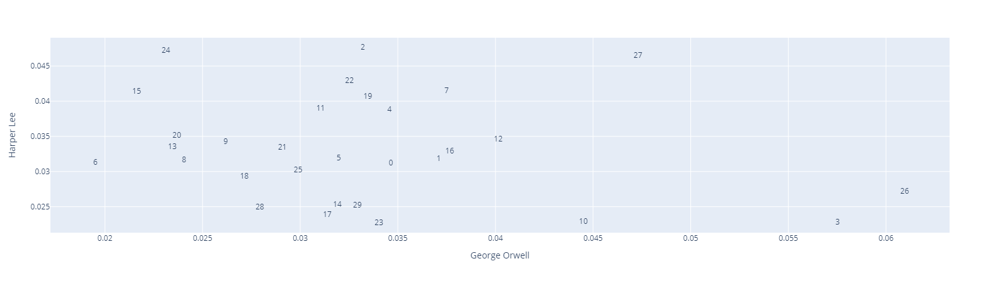

In [162]:
px.scatter(AUTHORS.reset_index(), 'George Orwell', 'Harper Lee', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

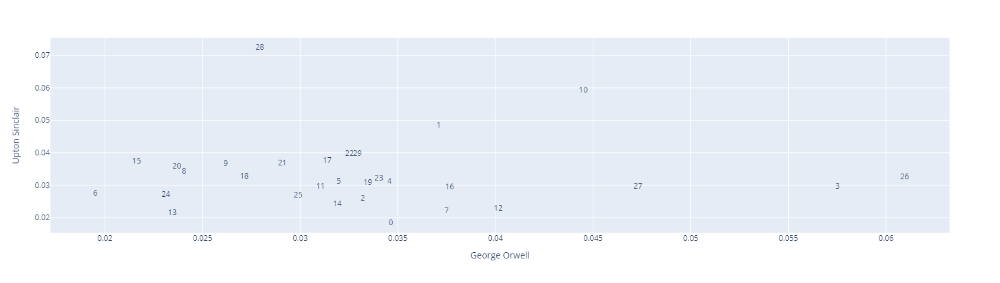

In [163]:
px.scatter(AUTHORS.reset_index(), 'George Orwell', 'Upton Sinclair', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

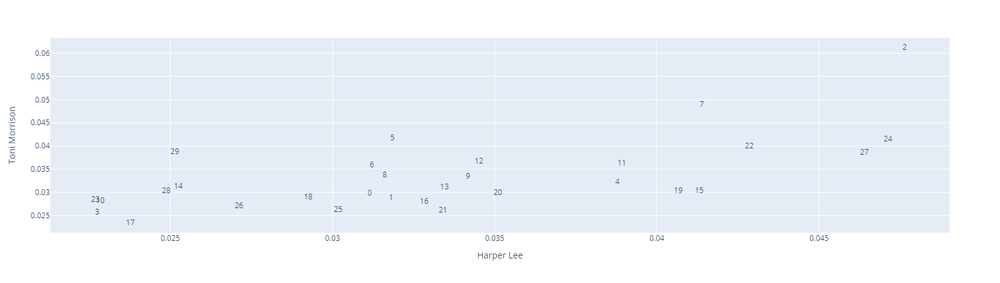

In [164]:
px.scatter(AUTHORS.reset_index(), 'Harper Lee', 'Toni Morrison', hover_name='topterms', text='topic_id')\
    .update_traces(mode='text')

#### Cluster Topics

In [165]:
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize

In [166]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

In [167]:
SIMS = pdist(normalize(PHI), metric='euclidean')
TREE = sch.linkage(SIMS, method='ward')

In [168]:
labels = ["{}: {}".format(a,b) for a, b in zip(AUTHORS.index,  AUTHORS.topterms.tolist())]

<Figure size 432x288 with 0 Axes>

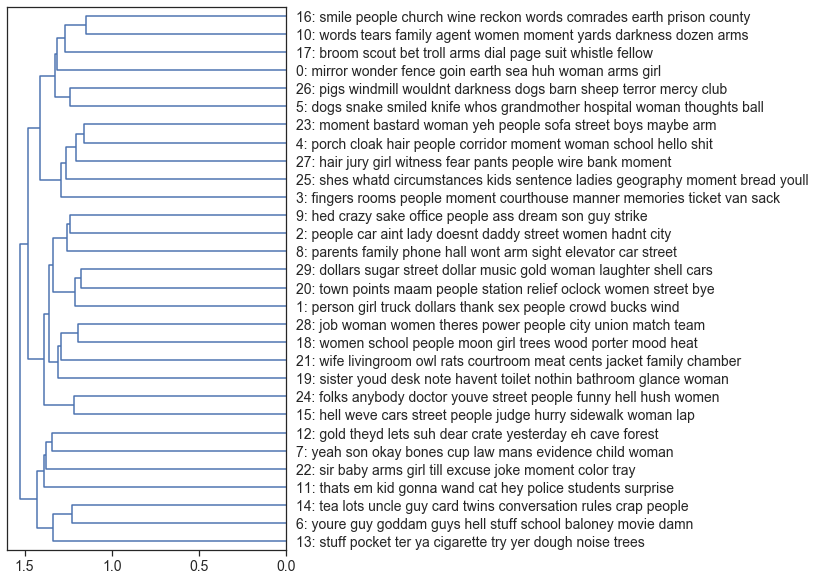

In [169]:
plot_tree(TREE, labels)

## Part 6: Word2Vec

#### Updated Configurations

In [170]:
from gensim.models import word2vec
from sklearn.manifold import TSNE

#### Read In Token table for conversion into corpus

In [171]:
token = pd.read_csv("TOKEN2.csv", dtype = {'Author':'str','Title':'str','chap_num':'int', 'para_num':'int', 'sent_num':'int', 'token_num':'int', 'book_id':'int','pos_tuple':'str','pos':'str','token_str':'str',\
                                           'term_str':'str','term_id': 'int'})
lib = pd.read_csv("LIB.csv") #don't actully need since TOKEN table already has author and title from previous files

In [172]:
token_index = token.set_index(OHCO)
token_index

term_id  \
Author         Title      chap_num para_num sent_num token_num            
George Orwell  1984       1        1        0        0            11215   
                                   2        1        4            11215   
                                            2        0            11215   
                                            4        0            11215   
                                            5        6            11215   
...                                                                 ...   
Upton Sinclair The Jungle 31       48       8        39           15682   
                                            12       8            13551   
                                            15       9            13551   
                                            16       8            20475   
                                            17       31           16646   

                                                                 index  \
Author         Title      chap_num para_num sent_num token_num           
George Orwell  1984       1        1        0        0               0   
                                   2        1        4              69   
                                            2        0              84   
                                            4        0             119   
                                            5        6             132   
...                                                                ...   
Upton Sinclair The Jungle 31       48       8        39         748319   
                                            12       8          748423   
                                            15       9          748490   
                                            16       8          748537   
                                            17       31         748589   

                                                                book_id  \
Author         Title      chap_num para_num sent_num token_num            
George Orwell  1984       1        1        0        0                1   
                                   2        1        4                1   
                                            2        0                1   
                                            4        0                1   
                                            5        6                1   
...                                                                 ...   
Upton Sinclair The Jungle 31       48       8        39               7   
                                            12       8                7   
                                            15       9                7   
                                            16       8                7   
                                            17       31               7   

                                                                            pos_tuple  \
Author         Title      chap_num para_num sent_num token_num                          
George Orwell  1984       1        1        0        0                  ('It', 'PRP')   
                                   2        1        4                  ('it', 'PRP')   
                                            2        0                  ('It', 'PRP')   
                                            4        0                  ('It', 'PRP')   
                                            5        6                  ('it', 'PRP')   
...                                                                               ...   
Upton Sinclair The Jungle 31       48       8        39             ('polled', 'VBN')   
                                            12       8            ('municipal', 'JJ')   
                                            15       9            ('municipal', 'JJ')   
                                            16       8          ('stultified', 'VBN')   
                                            17       31            ('rallying', '

#### Token tables for each author

In [173]:
#token table with only George Orwell
token_g = token[token["Author"] == 'George Orwell']

In [174]:
#token table with only J.D Salinger
token_j = token[token["Author"] == 'J.D. Salinger']

In [175]:
#token table with only J.K. Rowling
token_jk = token[token["Author"] == 'J.K. Rowling']

In [176]:
#token table with only 
token_t = token[token["Author"] == 'Toni Morrison']

In [177]:
#token table with only 
token_m = token[token["Author"] == 'Margaret Atwood']

In [178]:
#token table with only 
token_u = token[token["Author"] == 'Upton Sinclair']

In [179]:
#token table with only Harper Lee
token_h = token[token["Author"] == 'Harper Lee']

#### Corpus Creation

In [180]:
BAG = OHCO[:4]
# BAG = OHCO[:5] # Sentences
window = 4

In [181]:
# austen corpus
corpus_g = token_g[~token_g.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [182]:
# austen corpus
corpus_j = token_j[~token_j.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [183]:
# austen corpus
corpus_jk = token_jk[~token_jk.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [184]:
# austen corpus
corpus_t = token_t[~token_t.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [185]:
# austen corpus
corpus_m = token_m[~token_m.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [186]:
# austen corpus
corpus_u = token_u[~token_u.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [187]:
# austen corpus
corpus_h = token_h[~token_h.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [188]:
BAG = OHCO[:2]

In [189]:
corpus_full = token[~token.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

#### Generate word embeddings

In [190]:
model_g = word2vec.Word2Vec(corpus_g, vector_size=246, window=window, min_count=25, workers=6)

model_j = word2vec.Word2Vec(corpus_j, vector_size=246, window=window, min_count=25, workers=6)

model_jk = word2vec.Word2Vec(corpus_jk, vector_size=246, window=window, min_count=25, workers=6)

model_t = word2vec.Word2Vec(corpus_t, vector_size=246, window=window, min_count=25, workers=6)

model_u = word2vec.Word2Vec(corpus_u, vector_size=246, window=window, min_count=25, workers=6)

model_m = word2vec.Word2Vec(corpus_m, vector_size=246, window=window, min_count=25, workers=6)

model_h = word2vec.Word2Vec(corpus_h, vector_size=246, window=window, min_count=25, workers=6)

model_full = word2vec.Word2Vec(corpus_full, vector_size=246, window=window, min_count=100, workers=6)

#### Coordinates

In [191]:
#George Orwell coordinates
coords_g = pd.DataFrame(index=range(len(model_g.wv.index_to_key)))
coords_g['label'] = [w for w in model_g.wv.key_to_index]
coords_g['vector'] = coords_g['label'].apply(lambda x: model_g.wv.get_vector(x))

In [192]:
#JD Salinger coordinates
coords_j = pd.DataFrame(index=range(len(model_j.wv.key_to_index)))
coords_j['label'] = [w for w in model_j.wv.index_to_key]
coords_j['vector'] = coords_j['label'].apply(lambda x: model_j.wv.get_vector(x))

In [193]:
#JK Rowling coordinates
coords_jk = pd.DataFrame(index=range(len(model_jk.wv.key_to_index)))
coords_jk['label'] = [w for w in model_jk.wv.index_to_key]
coords_jk['vector'] = coords_jk['label'].apply(lambda x: model_jk.wv.get_vector(x))

In [194]:
#Toni Morison coordinates
coords_t = pd.DataFrame(index=range(len(model_t.wv.key_to_index)))
coords_t['label'] = [w for w in model_t.wv.index_to_key]
coords_t['vector'] = coords_t['label'].apply(lambda x: model_t.wv.get_vector(x))

In [195]:
#upton sinclair coordinates
coords_u = pd.DataFrame(index=range(len(model_u.wv.key_to_index)))
coords_u['label'] = [w for w in model_u.wv.index_to_key]
coords_u['vector'] = coords_u['label'].apply(lambda x: model_u.wv.get_vector(x))

In [196]:
#Harper Lee coordinates
coords_h = pd.DataFrame(index=range(len(model_h.wv.key_to_index)))
coords_h['label'] = [w for w in model_h.wv.index_to_key]
coords_h['vector'] = coords_h['label'].apply(lambda x: model_h.wv.get_vector(x))

In [197]:
#Margaret Atwood coordinates
coords_m = pd.DataFrame(index=range(len(model_m.wv.key_to_index)))
coords_m['label'] = [w for w in model_m.wv.index_to_key]
coords_m['vector'] = coords_m['label'].apply(lambda x: model_m.wv.get_vector(x))

In [198]:
#Margaret Atwood coordinates
coords_full = pd.DataFrame(index=range(len(model_full.wv.key_to_index)))
coords_full['label'] = [w for w in model_full.wv.index_to_key]
coords_full['vector'] = coords_full['label'].apply(lambda x: model_full.wv.get_vector(x))

#### TSNE Plots

In [199]:
tsne_modela = TSNE(perplexity=25, n_components=2, init='pca', n_iter=1500, random_state=23)
tsne_values_j = tsne_modela.fit_transform(coords_j['vector'].tolist())
tsne_values_t = tsne_modela.fit_transform(coords_t['vector'].tolist())
tsne_values_u = tsne_modela.fit_transform(coords_u['vector'].tolist())
tsne_values_jk = tsne_modela.fit_transform(coords_jk['vector'].tolist())
tsne_values_m = tsne_modela.fit_transform(coords_m['vector'].tolist())
tsne_values_g = tsne_modela.fit_transform(coords_g['vector'].tolist())
tsne_values_h = tsne_modela.fit_transform(coords_h['vector'].tolist())

In [200]:
# for full corpus
tsne_model = TSNE(perplexity=35, n_components=2, init='pca', n_iter=2250, random_state=44)
tsne_values_full = tsne_model.fit_transform(coords_full['vector'].tolist())

In [201]:
coords_j['x'] = tsne_values_j[:,0] #jd salinger
coords_j['y'] = tsne_values_j[:,1]

coords_jk['x'] = tsne_values_jk[:,0] #jk rowling
coords_jk['y'] = tsne_values_jk[:,1]

coords_g['x'] = tsne_values_g[:,0] #george orwell
coords_g['y'] = tsne_values_g[:,1]

coords_t['x'] = tsne_values_t[:,0] #toni morisson
coords_t['y'] = tsne_values_t[:,1]

coords_u['x'] = tsne_values_u[:,0] #upton sinclair
coords_u['y'] = tsne_values_u[:,1]

coords_m['x'] = tsne_values_m[:,0] #margaret thatcher
coords_m['y'] = tsne_values_m[:,1]

coords_h['x'] = tsne_values_h[:,0] #jd salinger
coords_h['y'] = tsne_values_h[:,1]

coords_full['x'] = tsne_values_full[:,0] #all books
coords_full['y'] = tsne_values_full[:,1]

#### Extract words and embeddings into one table

In [202]:
#add term_str for final table
coords_full2 = coords_full.rename(columns = {'label':'term_str'})

In [203]:
#merge token and coordinates to get term_id

#reduce token to needed columns
token_min = token[['term_id', 'term_str', 'Title', 'Author']]


coords_full2 = pd.merge(coords_full2, token_min, on = "term_str").drop_duplicates('term_id').set_index('term_id')

coords_full2

,term_str,vector,x,y,Title,Author
term_id,,,,,,
21330,the,"[-0.70330244, -0.41080064, -0.094053656, 0.394...",42.979023,0.183562,1984,George Orwell
779,and,"[-0.8938676, -0.56730175, -0.54398537, 0.27637...",43.172165,1.192047,1984,George Orwell
21656,to,"[-0.6563594, -0.57494175, -0.33114505, 0.09403...",43.292233,1.094525,1984,George Orwell
140,a,"[-0.7517337, -0.4628933, -0.24588984, 0.180923...",42.548145,0.467510,1984,George Orwell
14213,of,"[-0.8150329, -1.0133044, 0.0721576, 0.8616607,...",44.201828,0.193638,1984,George Orwell
...,...,...,...,...,...,...
23335,warm,"[-0.00087360444, 0.0039665885, -0.0010154732, ...",-20.085375,-3.623105,1984,George Orwell
6647,earth,"[0.0018507068, -0.00019557205, -0.0026015383, ...",-27.976551,4.907401,1984,George Orwell
14469,ought,"[-0.0017477274, 0.0009853152, -0.00029468827, ...",-26.575197,9.146974,1984,George Orwell


#### Export out embeddings table table

In [204]:
coords_full2.to_csv('terms_embeddings.csv')

#### Visualizations

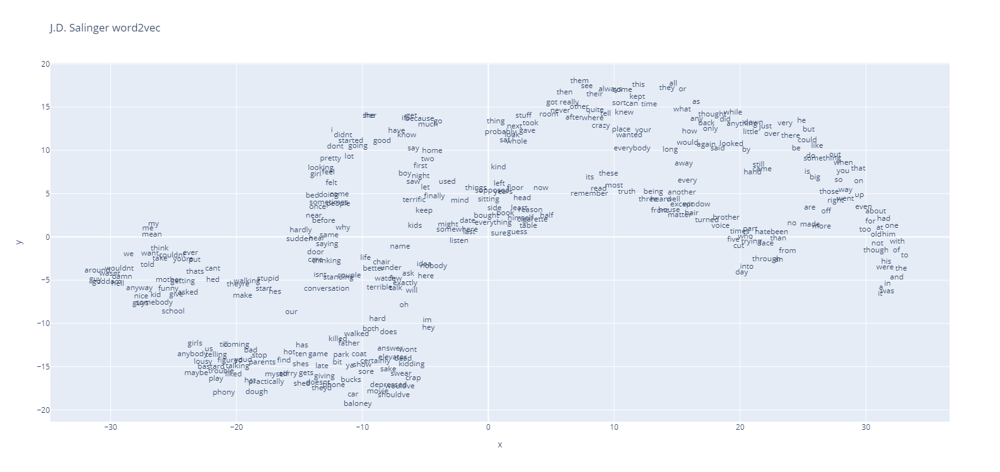

In [205]:
px.scatter(coords_j, 'x', 'y', text='label', height=750, title = 'J.D. Salinger word2vec').update_traces(mode='text')

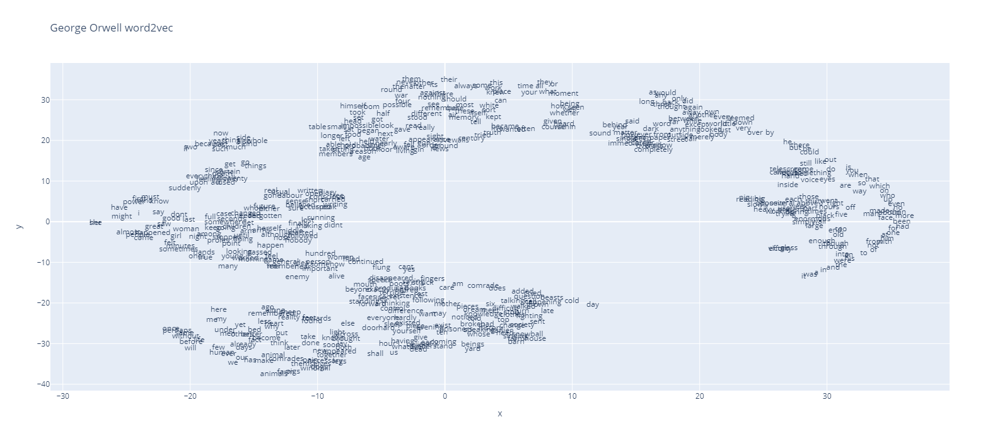

In [206]:
px.scatter(coords_g, 'x', 'y', text='label', height=700, title = 'George Orwell word2vec').update_traces(mode='text')

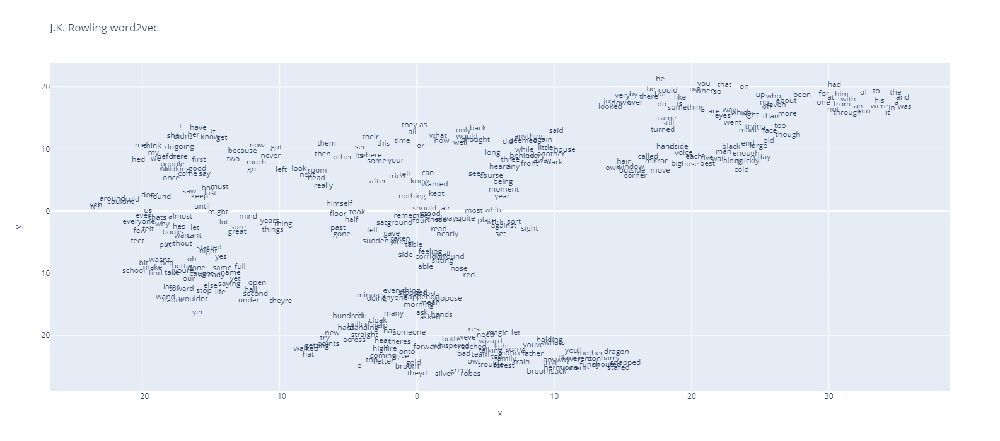

In [207]:
px.scatter(coords_jk, 'x', 'y', text='label', height=700, title = 'J.K. Rowling word2vec').update_traces(mode='text')

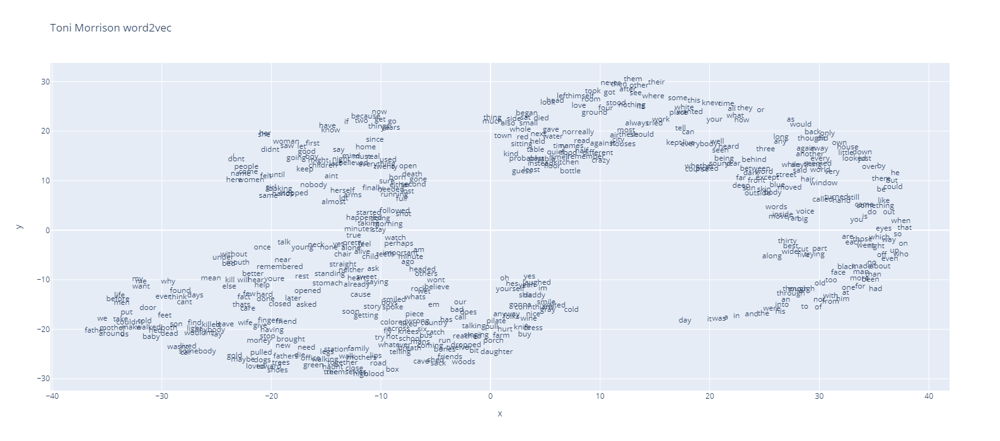

In [208]:
px.scatter(coords_t, 'x', 'y', text='label', height=700, title = 'Toni Morrison word2vec').update_traces(mode='text')

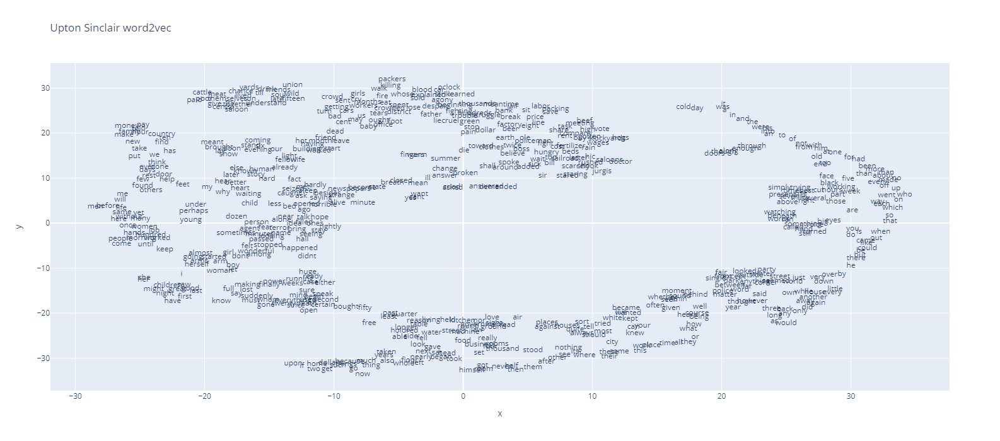

In [209]:
px.scatter(coords_u, 'x', 'y', text='label', height=700, title = 'Upton Sinclair word2vec').update_traces(mode='text')

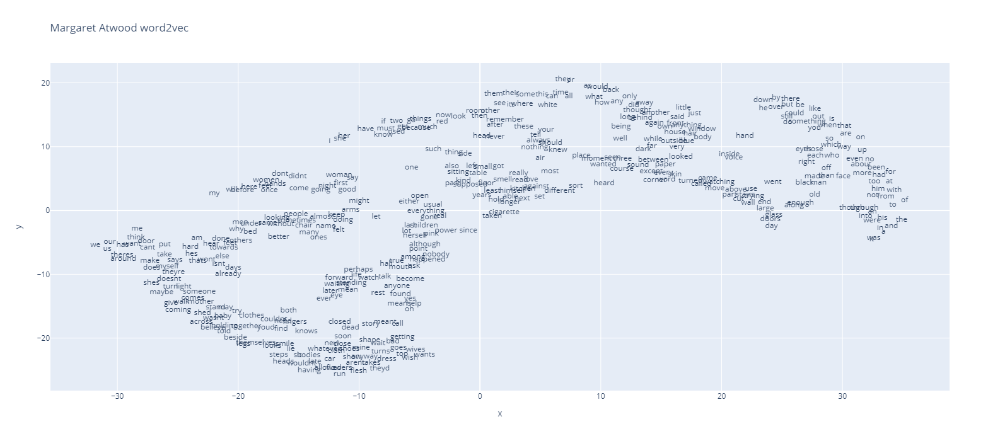

In [210]:
px.scatter(coords_m, 'x', 'y', text='label', height=700, title = 'Margaret Atwood word2vec').update_traces(mode='text')

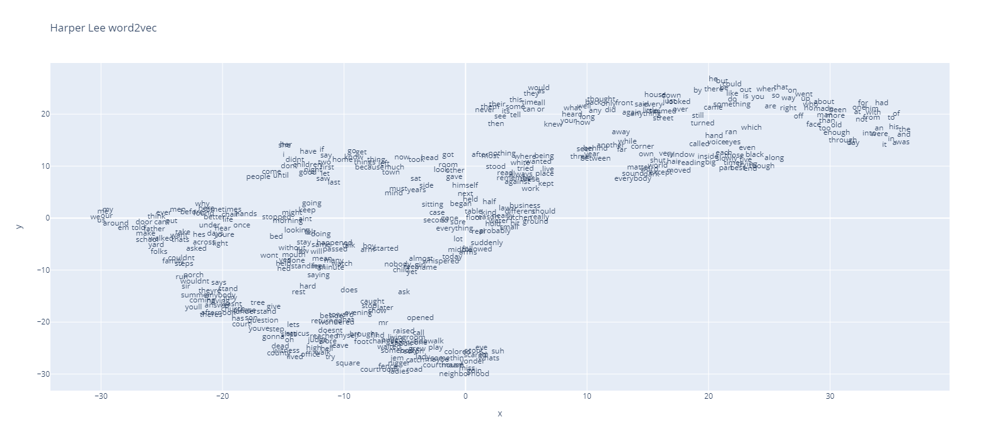

In [211]:
px.scatter(coords_h, 'x', 'y', text='label', height=700, title = 'Harper Lee word2vec').update_traces(mode='text')

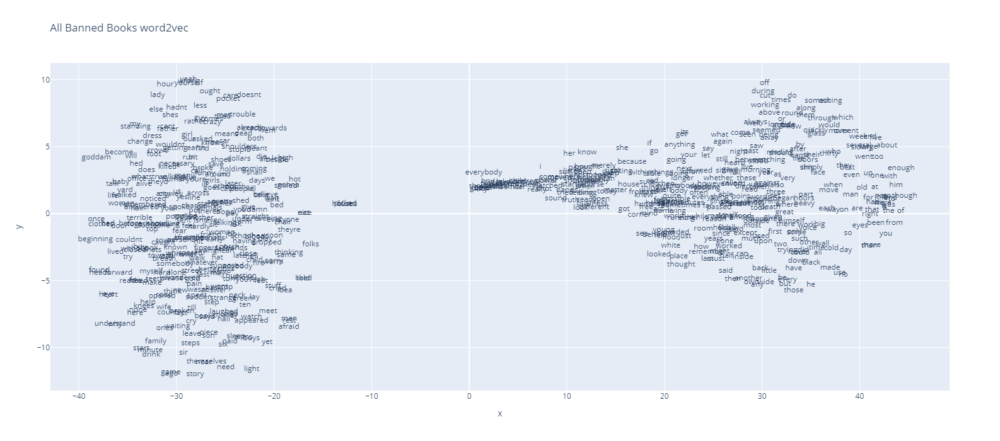

In [212]:
px.scatter(coords_full, 'x', 'y', text='label', height=700, title = 'All Banned Books word2vec').update_traces(mode='text')

## Part 7: Sentiment Analysis

#### Updated Configurations

In [213]:
from IPython.core.display import display, HTML
sns.set()

In [214]:
TOKENS = pd.read_csv("TOKEN2.csv", dtype = {'Author':'str','Title':'str','chap_num':'int', 'para_num':'int', 'sent_num':'int', 'token_num':'int', 'book_id':'int','pos_tuple':'str','pos':'str','token_str':'str',\
                                           'term_str':'str','term_id': 'int'})
OHCO = ["Author", "Title",'chap_num', 'para_num', 'sent_num', 'token_num']
CHAPS = OHCO[2:3]
PARAS = OHCO[2:4]
SENTS = OHCO[2:5]
TOKEN_OHCO = OHCO[2:6]
BOOKS = OHCO[:2]

#all titles in corpus
g_1984 = ('George Orwell','1984')
af = ('George Orwell','Animal Farm')
tkam = ('Harper Lee', 'To Kill a Mockingbird')
catcher = ('J.D. Salinger', 'Catcher in the Rye')
hp = ("J.K. Rowling", "Harry Potter and the Sorcerer's Stone")
ht = ('Margaret Atwood', "The Handmaid's Tale")
ss = ("Toni Morrison", 'Song of Solomon')
tj = ('Upton Sinclair','The Jungle')

lib = pd.read_csv("LIB.csv") #don't actully need since TOKEN table already has author and title from previous files

salex_csv = r"C:\Users\17039\Downloads\Sentiment\salex_nrc.csv"
nrc_cols = "nrc_negative nrc_positive nrc_anger nrc_anticipation nrc_disgust nrc_fear nrc_joy nrc_sadness nrc_surprise nrc_trust".split()
emo = 'polarity'

#### Lexicon

In [215]:
salex = pd.read_csv(salex_csv).set_index('term_str')
salex.columns = [col.replace('nrc_','') for col in salex.columns]

In [216]:
salex['polarity'] = salex.positive - salex.negative

In [217]:
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

#### Get Novels

In [218]:
cols = salex.columns.difference(TOKENS.columns)

TOKENS = pd.merge(TOKENS,salex[cols], on='term_str', how='inner')
TOKENS[emo_cols] = TOKENS[emo_cols].fillna(0) 

In [219]:
TOKENS = TOKENS.set_index(OHCO).sort_index()
TOKENS[salex.columns]

anger  \
Author         Title      chap_num para_num sent_num token_num          
George Orwell  1984       1        1        1        12             0   
                                                     23             0   
                                   2        2        24             0   
                                            5        12             0   
                                                     14             0   
...                                                               ...   
Upton Sinclair The Jungle 31       48       16       22             1   
                                            18       11             0   
                                                     15             0   
                                            19       2              1   
                                                     5              1   

                                                                anticipation  \
Author         Title      chap_num para_num sent_num token_num                 
George Orwell  1984       1        1        1        12                    1   
                                                     23                    1   
                                   2        2        24                    0   
                                            5        12                    1   
                                                     14                    0   
...                                                                      ...   
Upton Sinclair The Jungle 31       48       16       22                    0   
                                            18       11                    0   
                                                     15                    1   
                                            19       2                     0   
                                                     5                     0   

                                                                disgust  fear  \
Author         Title      chap_num para_num sent_num token_num                  
George Orwell  1984       1        1        1        12               0     1   
                                                     23               0     0   
                                   2        2        24               0     0   
                                            5        12               0     0   
                                                     14               0     0   
...                                                                 ...   ...   
Upton Sinclair The Jungle 31       48       16       22               1     0   
                                            18       11               0     0   
                                                     15               0     0   
                                            19       2                0     1   
                                                     5                0     0   

                                                                joy  negative  \
Author         Title      chap_num para_num sent_num token_num                  
George Orwell  1984       1        1        1        12           0         1   
                                                     23           1         0   
                                   2        2        24           0         1   
                                            5        12           1         0   
                                                     14           1         0   
...                                                             ...       ...   
Upton Sinclair The Jungle 31       48       16       22           0         1   
                                            18       11           0         0   
                                                     15           1         0   
                                            19       2            0         0   
                                               

In [220]:
TOKENS[emo_cols] = TOKENS[emo_cols].fillna(0)

#### Sentiment Values by token

In [221]:
TOKEN_sent = TOKENS[['term_str', 'term_id'] + emo_cols].reset_index().set_index('term_id')
TOKEN_sent

,Author,Title,chap_num,para_num,sent_num,token_num,term_str,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
term_id,,,,,,,,,,,,,,,,
7162,George Orwell,1984,1,1,1,12,escape,0,1,0,1,0,0,0,0,0
23048,George Orwell,1984,1,1,1,23,victory,0,1,0,0,1,0,0,1,1
2038,George Orwell,1984,1,2,2,24,black,0,0,0,0,0,1,0,0,-1
15969,George Orwell,1984,1,2,5,12,present,0,1,0,0,1,0,1,1,1
6804,George Orwell,1984,1,2,5,14,electric,0,0,0,0,1,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12079,Upton Sinclair,The Jungle,31,48,16,22,lie,1,0,1,0,0,1,0,0,-1
12728,Upton Sinclair,The Jungle,31,48,18,11,marshal,0,0,0,0,0,0,0,1,1
23048,Upton Sinclair,The Jungle,31,48,18,15,victory,0,1,0,0,1,0,0,1,1


##### Emotion Values by book

In [222]:
token_emo = TOKEN_sent.copy()
token_emo_book =  token_emo.groupby(BOOKS)[emo_cols].mean().reset_index()

In [223]:
token_emo_book.to_csv('sentiment_val_book.csv')

In [224]:
TOKEN_sent.to_csv("sentiment_emotion_polarity.csv")

In [225]:
G_1 = TOKENS.loc[g_1984].copy()
G_2 = TOKENS.loc[af].copy()
H_1 = TOKENS.loc[tkam].copy()
J_1 = TOKENS.loc[catcher].copy()
JK_1 = TOKENS.loc[hp].copy()
M_1 = TOKENS.loc[ht].copy()
T_1 = TOKENS.loc[ss].copy()
U_1 = TOKENS.loc[tj].copy()

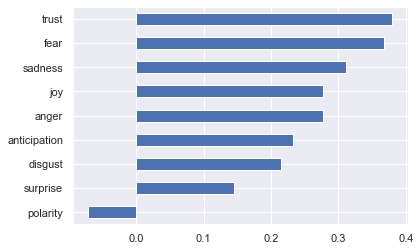

In [226]:
G_1[emo_cols].mean().sort_values().plot.barh()

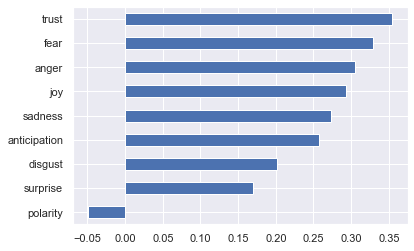

In [227]:
G_2[emo_cols].mean().sort_values().plot.barh()

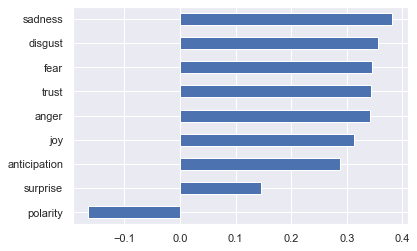

In [228]:
J_1[emo_cols].mean().sort_values().plot.barh()

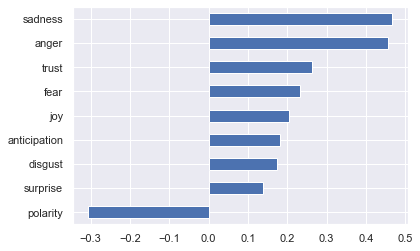

In [229]:
JK_1[emo_cols].mean().sort_values().plot.barh()

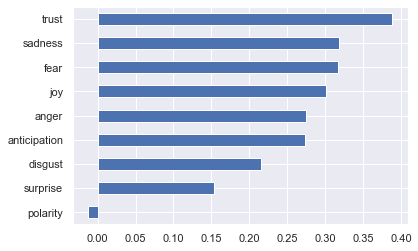

In [230]:
H_1[emo_cols].mean().sort_values().plot.barh()

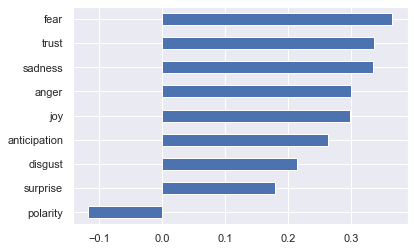

In [231]:
U_1[emo_cols].mean().sort_values().plot.barh()

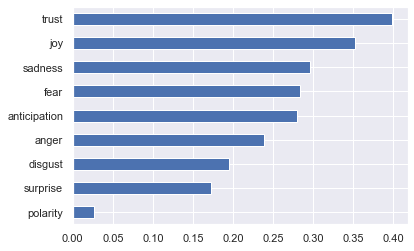

In [232]:
M_1[emo_cols].mean().sort_values().plot.barh()

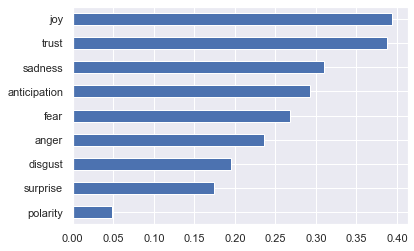

In [233]:
T_1[emo_cols].mean().sort_values().plot.barh()

### Sentiment by Chapter

In [234]:
G_1chaps = G_1.groupby(CHAPS)[emo_cols].mean()
G_2chaps = G_2.groupby(CHAPS)[emo_cols].mean()
J_1chaps = J_1.groupby(CHAPS)[emo_cols].mean()
JK_1chaps = JK_1.groupby(CHAPS)[emo_cols].mean()
H_1chaps = H_1.groupby(CHAPS)[emo_cols].mean()
M_1chaps = M_1.groupby(CHAPS)[emo_cols].mean()
T_1chaps = T_1.groupby(CHAPS)[emo_cols].mean()
U_1chaps = U_1.groupby(CHAPS)[emo_cols].mean()

In [235]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

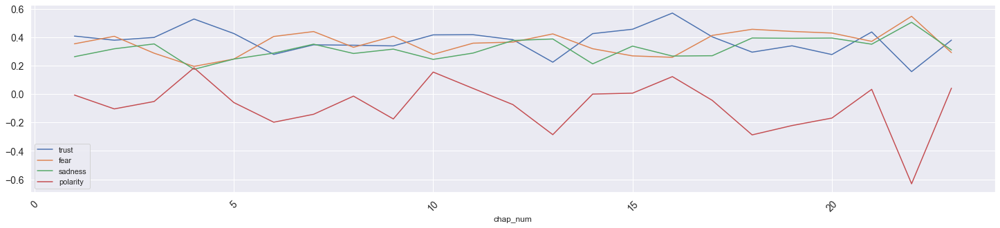

In [236]:
plot_sentiments(G_1chaps, ['trust','fear','sadness','polarity'])

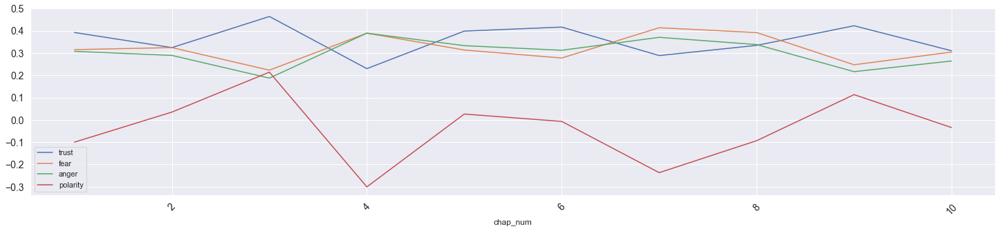

In [237]:
plot_sentiments(G_2chaps, ['trust','fear','anger','polarity'])

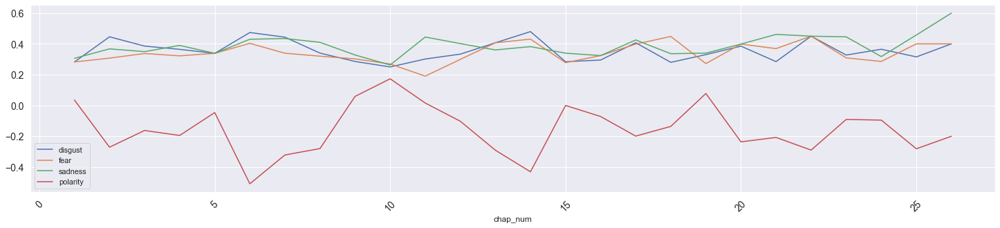

In [238]:
plot_sentiments(J_1chaps, ['disgust','fear','sadness','polarity'])

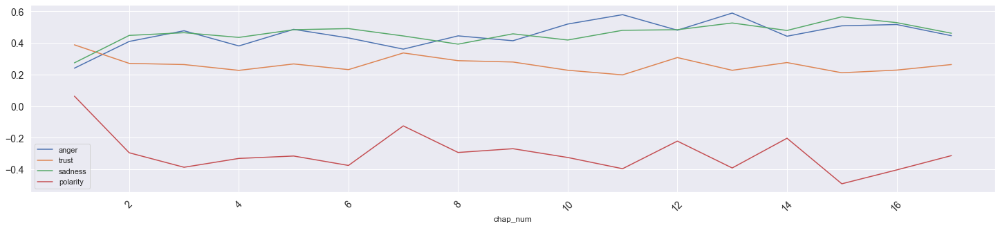

In [239]:
plot_sentiments(JK_1chaps, ['anger','trust','sadness','polarity'])

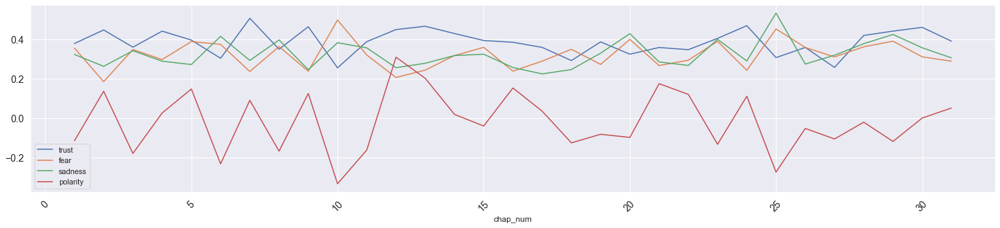

In [240]:
plot_sentiments(H_1chaps, ['trust','fear','sadness','polarity'])

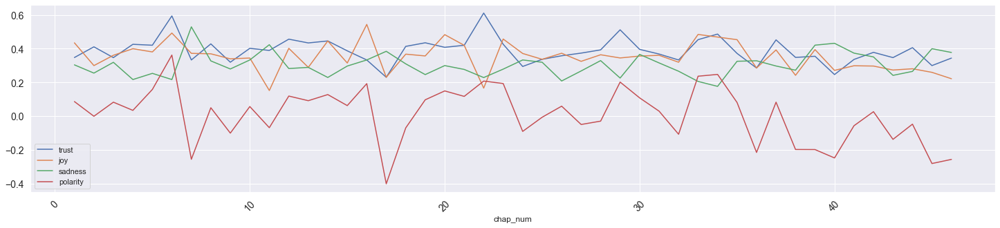

In [241]:
plot_sentiments(M_1chaps, ['trust','joy','sadness','polarity'])

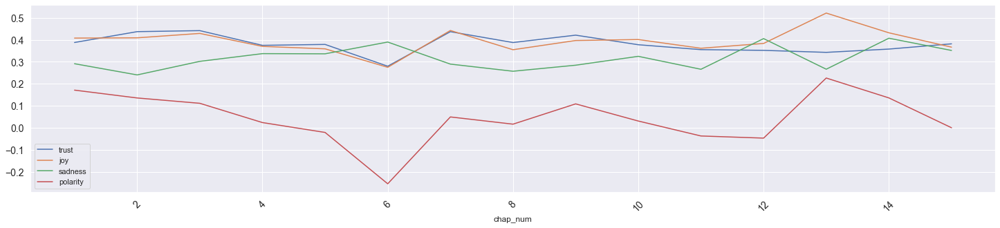

In [242]:
plot_sentiments(T_1chaps, ['trust','joy','sadness','polarity'])

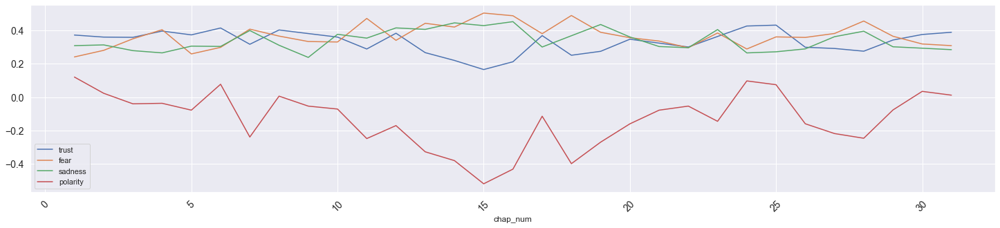

In [243]:
plot_sentiments(U_1chaps, ['trust','fear','sadness','polarity'])

#### Sentiment in Texts

In [244]:
G_1['html'] =  G_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
G_2['html'] =  G_2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
J_1['html'] =  J_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
JK_1['html'] =  JK_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
H_1['html'] =  H_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
M_1['html'] =  M_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
T_1['html'] = T_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)
U_1['html'] =  U_1.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.token_str), 1)

In [245]:
G_1['html'].sample(10)

chap_num  para_num  sent_num  token_num
11        21        1         7                  <span class='sent1'>ceremony</span>
17        3         0         111          <span class='sent1'>unquestionably</span>
          74        0         8                  <span class='sent0'>ultimate</span>
6         15        3         8              <span class='sent-1'>unthinkable</span>
5         54        9         15                <span class='sent1'>chocolate</span>
14        17        10        11                  <span class='sent-1'>grave,</span>
16        57        4         4               <span class='sent1'>Brotherhood</span>
18        72        11        22                    <span class='sent0'>watch</span>
          69        1         0                 <span class='sent1'>Officer!’</span>
8         21        3         8                   <span class='sent-1'>attack</span>
Name: html, dtype: object

In [246]:
G1_sents = G_1.groupby(SENTS)[emo_cols].mean()
G2_sents =G_2.groupby(SENTS)[emo_cols].mean()
J1_sents = J_1.groupby(SENTS)[emo_cols].mean()
JK1_sents = JK_1.groupby(SENTS)[emo_cols].mean()
H1_sents = H_1.groupby(SENTS)[emo_cols].mean()
M1_sents = M_1.groupby(SENTS)[emo_cols].mean()
T1_sents = T_1.groupby(SENTS)[emo_cols].mean()
U1_sents = U_1.groupby(SENTS)[emo_cols].mean()

In [247]:
G1_sents['sent_str'] = G_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
G1_sents['html_str'] = G_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

G2_sents['sent_str'] =G_2.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
G2_sents['html_str'] =G_2.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

J1_sents['sent_str'] = J_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
J1_sents['html_str'] = J_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

JK1_sents['sent_str'] = JK_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
JK1_sents['html_str'] = JK_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

H1_sents['sent_str'] = H_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
H1_sents['html_str'] = H_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

M1_sents['sent_str'] = M_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
M1_sents['html_str'] = M_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

T1_sents['sent_str'] = T_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
T1_sents['html_str'] = T_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

U1_sents['sent_str'] = U_1.groupby(SENTS).term_str.apply(lambda x: x.str.cat(sep=' '))
U1_sents['html_str'] = U_1.groupby(SENTS).html.apply(lambda x: x.str.cat(sep=' '))

In [248]:
def sample_sentences(df):
    rows = []
    for idx in df.sample(10).index:

        valence = round(df.loc[idx, emo], 4)     
        t = 0
        if valence > t: color = '#35D71E'
        elif valence < t: color = '#D87673'
        else: color = '#f2f2f2'
        z=0
        rows.append("""<tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
        <td>{1}</td><td>{3}</td><td width="400" style="text-align:left;">{2}</td>
        </tr>""".format(color, valence, df.loc[idx, 'html_str'], idx))

    display(HTML('<style>#sample1 td{font-size:120%;vertical-align:top;} .sent-1{color:red;font-weight:bold;} .sent1{color:green;font-weight:bold;}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentiment</th><th>ID</th><th width="600">Sentence</th></tr>'+''.join(rows)+'</table>'))

In [249]:
sample_sentences(G1_sents)

Sentiment,ID,Sentence
0.0,"(2, 32, 2)","victory, drown lost chocolate"
-1.0,"(5, 32, 10)",elimination
-1.0,"(19, 123, 0)",concealed.
-0.3333,"(11, 6, 10)","darkened, found lying"
1.0,"(1, 34, 6)",Brother
1.0,"(20, 35, 23)","loyalty, loyalty"
-1.0,"(22, 20, 3)",cage
0.0,"(8, 18, 10)",absence real
-1.0,"(17, 4, 16)",commotion.
1.0,"(17, 19, 6)","ultimately word, found"


In [250]:
sample_sentences(G2_sents)

Sentiment,ID,Sentence
1.0,"(2, 17, 2)",top
-1.0,"(1, 48, 1)",gun shot darkness.
-1.0,"(4, 4, 5)",rage ridiculous.
0.0,"(5, 13, 4)",vote
-1.0,"(5, 23, 8)",gruff
1.0,"(9, 30, 2)",intended banquet
1.0,"(7, 5, 0)",obvious
1.0,"(6, 9, 8)",respect
0.0,"(5, 23, 3)",clean gun.
1.0,"(1, 4, 4)","usual, finally word"


In [251]:
sample_sentences(J1_sents)

Sentiment,ID,Sentence
1.0,"(21, 54, 0)",doctor.
-1.0,"(3, 6, 6)",I'll
-1.0,"(7, 21, 4)",I'll
-1.0,"(6, 63, 6)","Boy, worried."
-1.0,"(13, 16, 2)",damn
-1.0,"(24, 136, 3)",damn
0.0,"(11, 1, 6)",intimately.
1.0,"(15, 37, 4)",iron friend
0.0,"(13, 38, 15)",feeling
-0.5,"(5, 14, 15)","mother, boy"


In [252]:
sample_sentences(JK1_sents)

Sentiment,ID,Sentence
-1.0,"(16, 182, 0)",Harry
-1.0,"(11, 82, 0)",“Foul!”
-1.0,"(12, 24, 1)","Harry,"
-1.0,"(3, 110, 0)",“I’ll
-1.0,"(17, 10, 3)",broke
-1.0,"(5, 229, 2)",slimy
-1.0,"(16, 225, 0)",black
0.0,"(15, 59, 0)","moan,"
1.0,"(12, 25, 0)",Professor tree.
-1.0,"(17, 169, 6)",I’ll


In [253]:
sample_sentences(H1_sents)

Sentiment,ID,Sentence
-1.0,"(23, 26, 0)",offense
-0.2,"(10, 6, 1)","bout committed cowardice, word fight"
0.5,"(21, 51, 3)",court reporter
-1.0,"(18, 39, 0)",afraid cry
1.0,"(28, 32, 0)",money
-1.0,"(17, 78, 2)",words afraid
-0.5,"(1, 13, 0)",mother absence.
1.0,"(9, 102, 1)",lover!”
0.0,"(16, 86, 5)",revival unreliable
-1.0,"(9, 175, 3)",evasion evasion


In [254]:
sample_sentences(M1_sents)

Sentiment,ID,Sentence
1.0,"(19, 8, 0)",word
-1.0,"(44, 31, 0)",terror.
0.0,"(45, 17, 10)",cane.
1.0,"(19, 27, 5)",Aunt
-1.0,"(21, 17, 6)",Crouching
0.5,"(27, 46, 2)",hope rising sap tree.
-1.0,"(46, 21, 0)",black
0.0,"(10, 7, 0)","lonely, baby,"
1.0,"(45, 17, 9)",love
-1.0,"(38, 11, 3)",wait


In [255]:
sample_sentences(T1_sents)

Sentiment,ID,Sentence
-1.0,"(2, 111, 2)","words,"
-1.0,"(11, 132, 0)",Boy liquor.
-1.0,"(9, 182, 0)",crazy.
1.0,"(10, 345, 3)",explain
1.0,"(13, 133, 0)",baby
0.0,"(14, 6, 1)",gray
1.0,"(3, 1, 6)",friend
-1.0,"(10, 146, 9)","slave, lose"
1.0,"(8, 98, 0)",planning.
-1.0,"(3, 105, 0)",wait


In [256]:
sample_sentences(U1_sents)

Sentiment,ID,Sentence
0.0,"(31, 46, 5)",shout
-1.0,"(25, 1, 1)",blast
-1.0,"(20, 4, 11)",horror despair agony scarcely shame loathing
-1.0,"(31, 18, 9)",whip
-1.0,"(7, 16, 3)","boy late, screaming pain."
0.5,"(27, 8, 2)","fellow “hobo,” lucky finally"
1.0,"(7, 4, 5)","possess goodness, virtue"
-1.0,"(28, 52, 3)","words,"
1.0,"(10, 17, 2)",baby.
0.0,"(29, 24, 3)",Socialism


### VADER

In [257]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

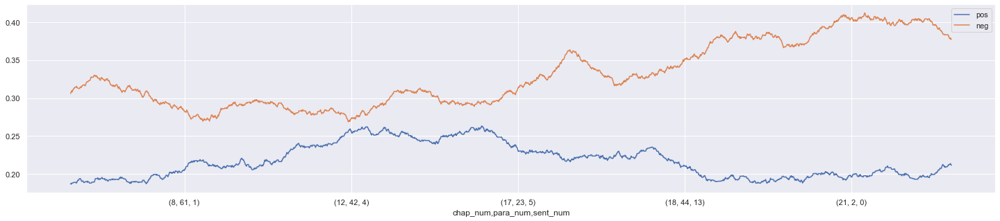

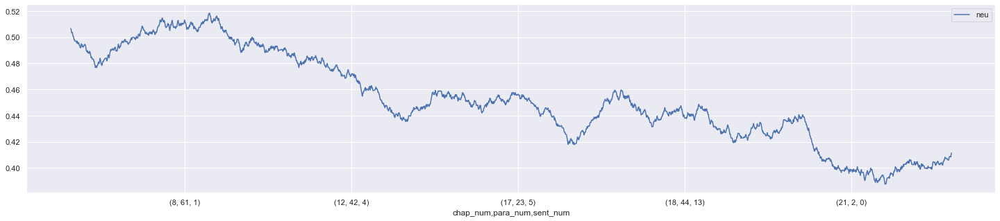

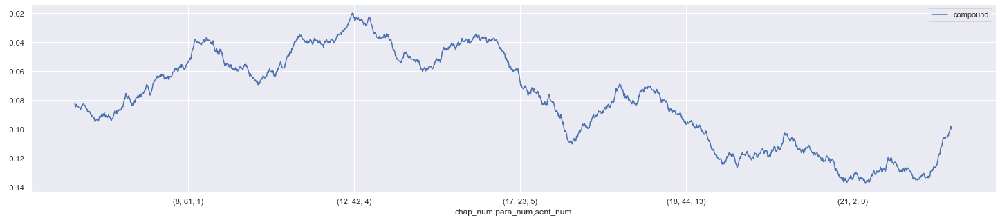

In [258]:
g1_vader_cols = G1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
g1_vader = pd.concat([G1_sents, g1_vader_cols], axis=1)
w = int(g1_vader.shape[0] / 5)
g1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
g1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
g1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

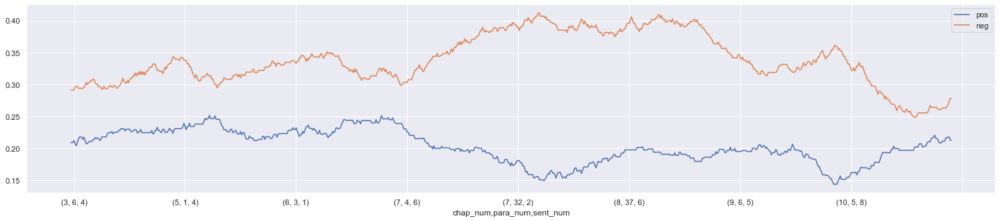

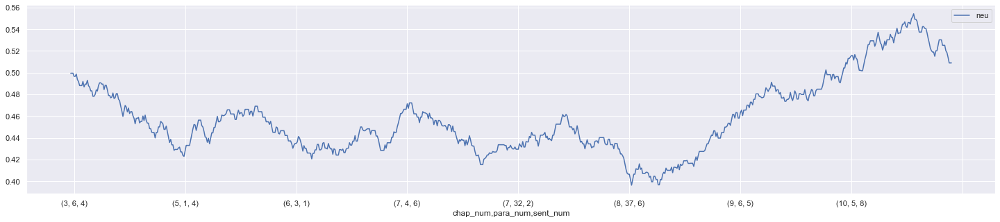

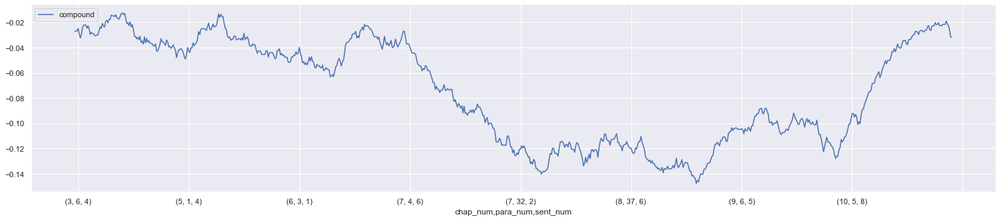

In [259]:
g2_vader_cols = G2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
g2_vader = pd.concat([G2_sents, g2_vader_cols], axis=1)
w = int(g2_vader.shape[0] / 5)
g2_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
g2_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
g2_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

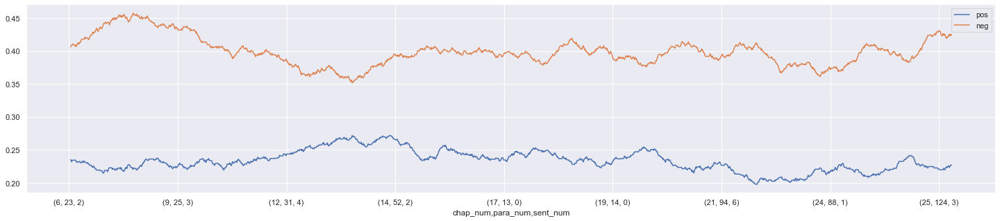

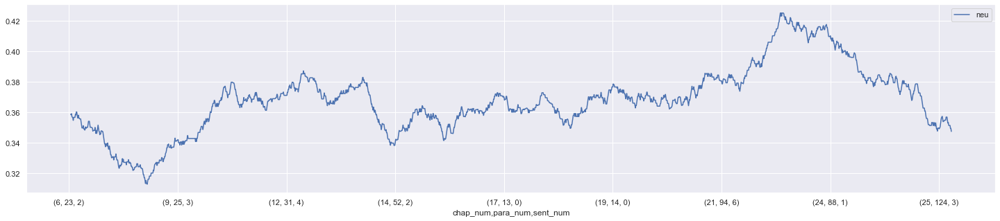

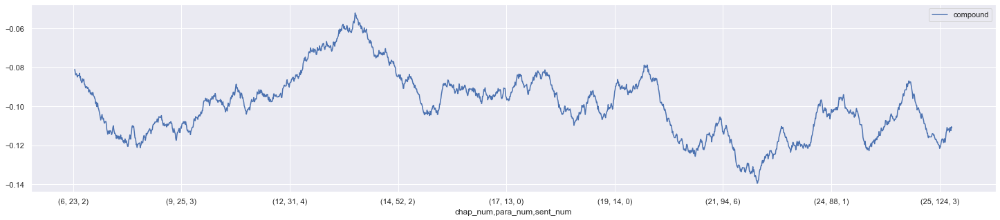

In [260]:
j1_vader_cols = J1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
j1_vader = pd.concat([J1_sents, j1_vader_cols], axis=1)
w = int(j1_vader.shape[0] / 5)
j1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
j1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
j1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

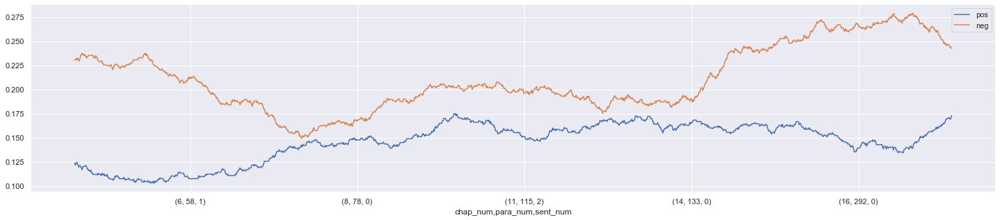

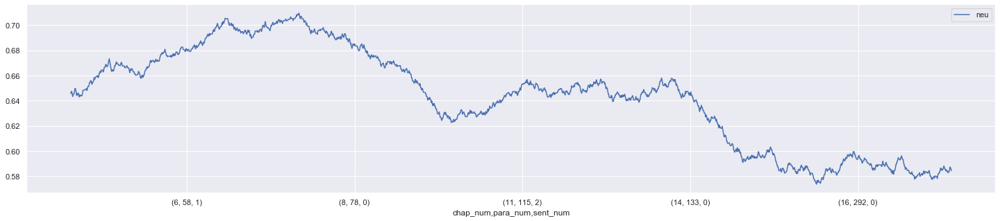

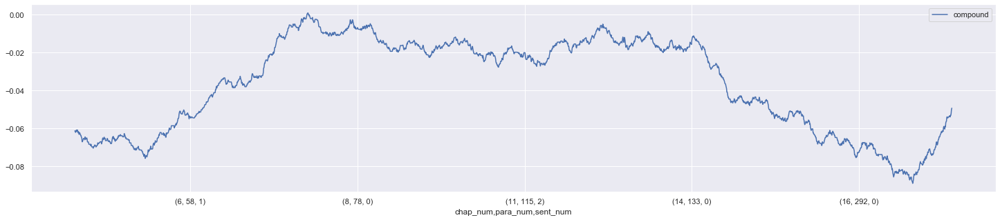

In [261]:
jk1_vader_cols = JK1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
jk1_vader = pd.concat([JK1_sents, jk1_vader_cols], axis=1)
w = int(jk1_vader.shape[0] / 5)
jk1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
jk1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
jk1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

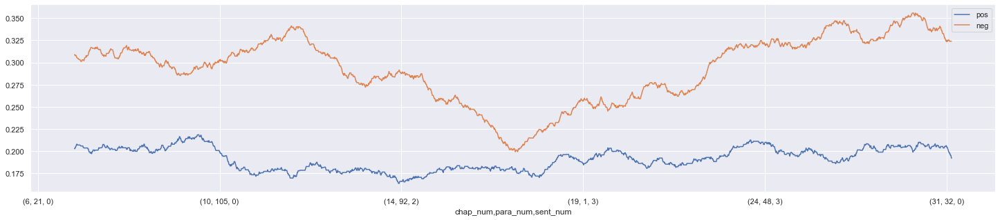

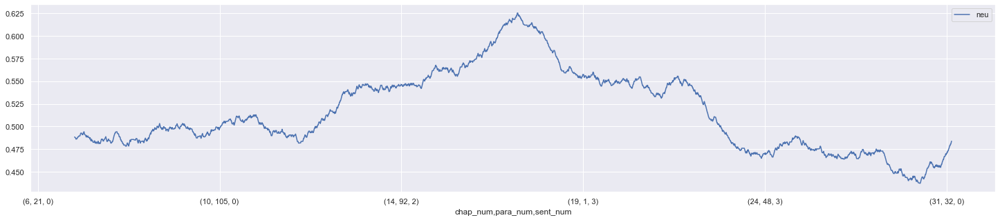

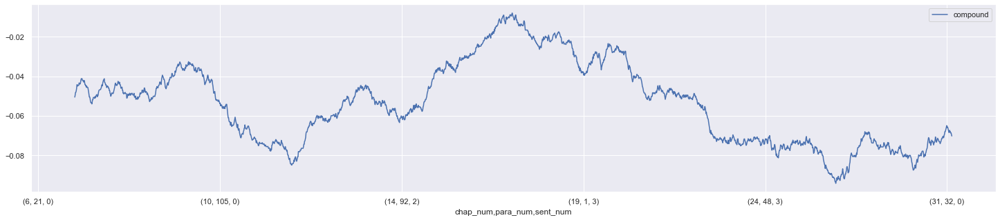

In [262]:
h1_vader_cols = H1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
h1_vader = pd.concat([H1_sents, h1_vader_cols], axis=1)
w = int(h1_vader.shape[0] / 5)
h1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
h1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
h1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

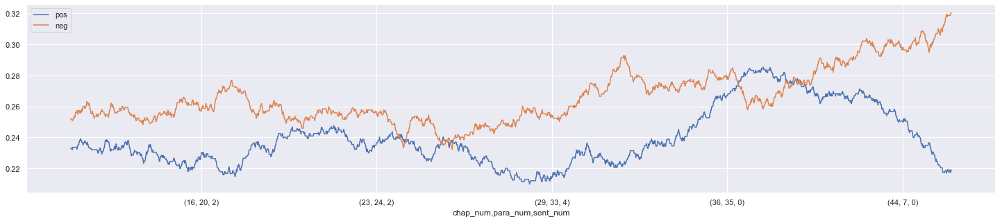

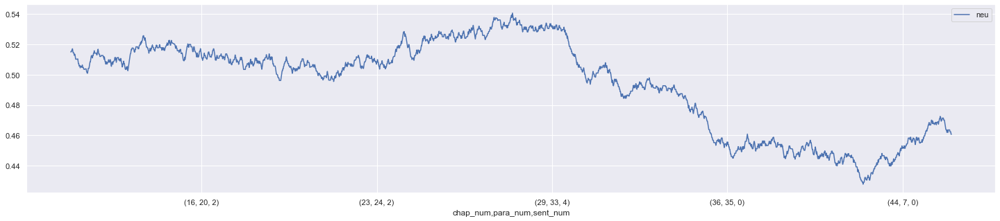

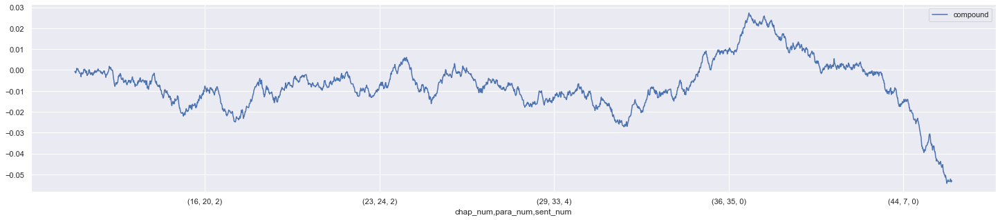

In [263]:
m1_vader_cols = M1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
m1_vader = pd.concat([M1_sents, m1_vader_cols], axis=1)
w = int(m1_vader.shape[0] / 5)
m1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
m1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
m1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

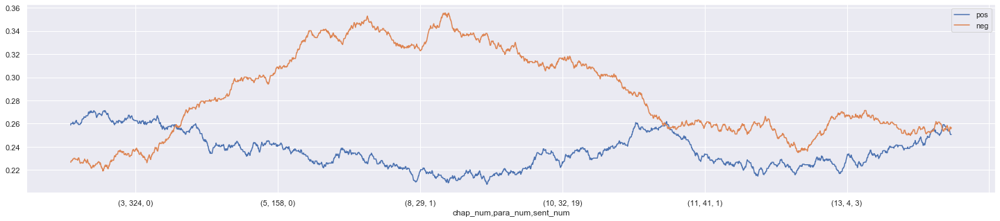

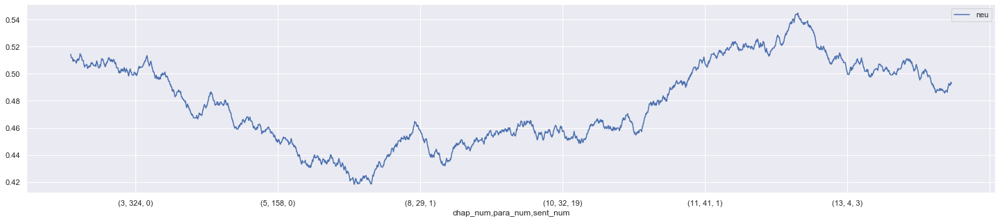

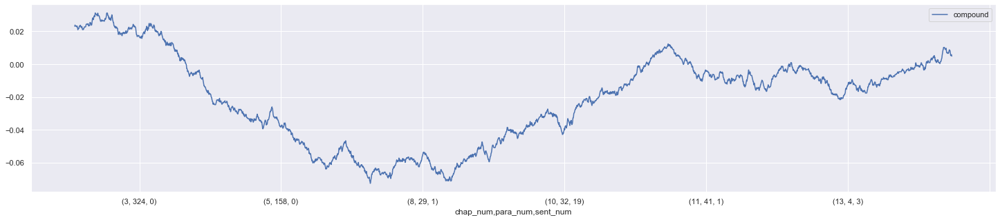

In [264]:
t1_vader_cols = T1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
t1_vader = pd.concat([T1_sents, t1_vader_cols], axis=1)
w = int(t1_vader.shape[0] / 5)
t1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
t1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
t1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

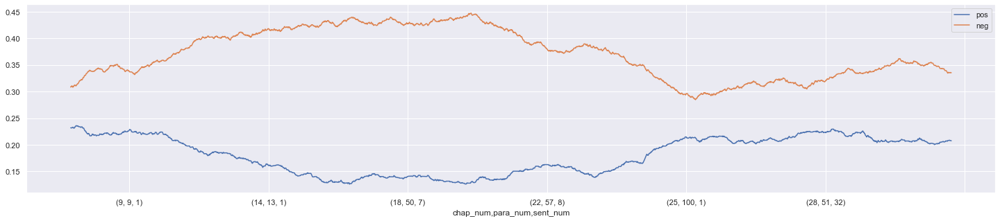

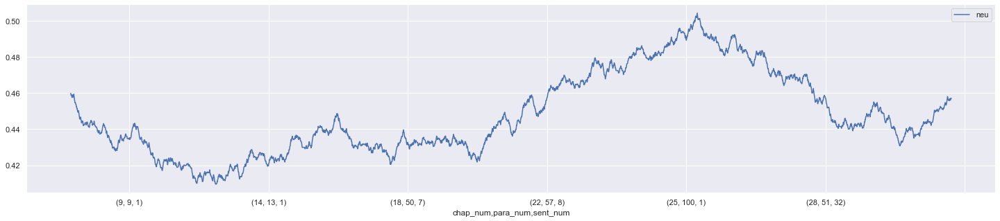

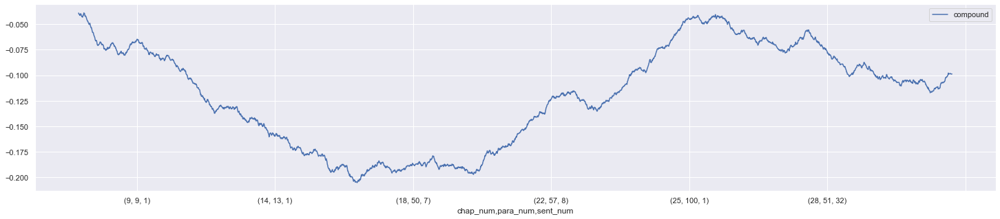

In [265]:
u1_vader_cols = U1_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
u1_vader = pd.concat([U1_sents, u1_vader_cols], axis=1)
w = int(u1_vader.shape[0] / 5)
u1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
u1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
u1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

#### Final Run Time

In [266]:
run_time = time.time() - t0

In [267]:
mins = run_time/60
print("Total Run Time :", mins,'Minutes')

Total Run Time : 4.515454387664795 Minutes
